## Imports and Setup

In [1]:
import torch
torch.cuda.empty_cache() 

In [2]:
torch.cuda.set_device(1)

In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [4]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, Trainer, TrainingArguments
from transformers import LlamaTokenizer, LlamaForCausalLM
from datasets import load_dataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

/home/b22cs092/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


In [5]:
import torch
torch.cuda.empty_cache()

In [6]:
print("GPUs Available:", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

GPUs Available: 1
GPU 0: NVIDIA L40S


In [7]:
print(torch.cuda.current_device())  # Index of the current device

1


In [1]:
!nvidia-smi

Sun Oct  5 10:39:32 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.144.03             Driver Version: 550.144.03     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L40S                    Off |   00000000:61:00.0 Off |                    0 |
| N/A   23C    P8             31W /  350W |      11MiB /  46068MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [9]:
dataset = load_dataset('wikitext', 'wikitext-2-raw-v1')

print("Sample from WikiText-2:")
for i in range(5):
    print(f"Example {i}: {repr(dataset['train'][i]['text'][:100])}...")

Sample from WikiText-2:
Example 0: ''...
Example 1: ' = Valkyria Chronicles III = \n'...
Example 2: ''...
Example 3: ' Senjō no Valkyria 3 : Unrecorded Chronicles ( Japanese : 戦場のヴァルキュリア3 , lit . Valkyria of the Battle'...
Example 4: ' The game began development in 2010 , carrying over a large portion of the work done on Valkyria Chr'...


### Tokenizer

In [10]:
def tokenize_function(examples):
    inputs = tokenizer(
        examples['text'], 
        truncation=True, 
        padding='max_length', 
        max_length=512,
        return_attention_mask=True,
    )
    inputs['labels'] = inputs['input_ids'].copy()
    return inputs

## GPT-2

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("openai-community/gpt2")
model = AutoModelForCausalLM.from_pretrained("openai-community/gpt2").to(device)



In [ ]:
# Set the EOS token as the padding token
tokenizer.pad_token = tokenizer.eos_token

In [ ]:
model.config.pad_token_id = tokenizer.pad_token_id

In [ ]:
tokenized_datasets = dataset.map(tokenize_function, batched=True)

In [ ]:
tokenized_datasets

In [ ]:
tokenized_datasets['train']

In [ ]:
pip install 'accelerate>=0.26.0'  --break-system-packages --user

In [16]:
training_args = TrainingArguments(
    output_dir='kv/results',
    eval_strategy='epoch',
    num_train_epochs=1,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='kv/logs'
)

In [17]:
import os
os.makedirs("kv", exist_ok=True)


In [16]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets['train'],
    eval_dataset=tokenized_datasets['validation'],
)


In [17]:

trainer.train()

model_output_dir = 'kv/results/model'

model.save_pretrained(model_output_dir)
tokenizer.save_pretrained(model_output_dir)

/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.425800,0.418304


/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch

('kv/results/model/tokenizer_config.json',
 'kv/results/model/special_tokens_map.json',
 'kv/results/model/vocab.json',
 'kv/results/model/merges.txt',
 'kv/results/model/added_tokens.json',
 'kv/results/model/tokenizer.json')

In [20]:
pip install openpyxl --break-system-packages --user

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 1.8 MB/s eta 0:00:00a 0:00:01m
Note: you may need to restart the kernel to use updated packages.


In [18]:
!pip install sentencepiece --break-system-packages --user

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 2.9 MB/s eta 0:00:0000:0100:010m


In [26]:
print(type(model))


<class 'transformers.models.gpt2.modeling_gpt2.GPT2LMHeadModel'>


In [27]:
print(tokenizer.model_max_length)
print(tokenizer.padding_side)


1024
right


## TinyLlama

In [28]:
import time
import numpy as np
import pandas as pd

In [14]:
!PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

In [30]:
"TinyLlama/TinyLlama-1.1B-Chat-v1.0", "Maykeye/TinyLLama-v0"

('TinyLlama/TinyLlama-1.1B-Chat-v1.0', 'Maykeye/TinyLLama-v0')

In [31]:
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name).to(device)
tokenizer.pad_token = tokenizer.eos_token
model.generation_config.pad_token_id = tokenizer.pad_token_id

In [17]:
!nvidia-smi

Fri Aug 29 04:08:59 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.144.03             Driver Version: 550.144.03     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L40S                    Off |   00000000:61:00.0 Off |                    0 |
| N/A   31C    P0             86W /  350W |    2628MiB /  46068MiB |      9%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [18]:
!ps -u -p 530187,3319341,449911

USER         PID %CPU %MEM    VSZ   RSS TTY      STAT START   TIME COMMAND
d23cse0+  449911  196 18.5 122496620 48975808 ?  Rl   Aug26 8481:09 python3 main
debasis   530187  184  0.7 23333184 2096032 pts/10 Rl Aug28 2359:21 python3 -u t
b22cs092 3319341 12.5  0.4 23449480 1149616 ?    Ssl  04:06   0:22 /usr/bin/pyth


In [33]:
tokenized_datasets = dataset.map(tokenize_function, batched=True)

Map: 100%|███████████████████████████████████████████████████████████████| 36718/36718 [00:06<00:00, 5886.00 examples/s]


In [34]:
tokenized_datasets

DatasetDict({
    test: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 4358
    })
    train: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 36718
    })
    validation: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 3760
    })
})

In [24]:
model.train()

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 2048)
    (layers): ModuleList(
      (0-21): 22 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2048, out_features=256, bias=False)
          (v_proj): Linear(in_features=2048, out_features=256, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2048, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (up_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (down_proj): Linear(in_features=5632, out_features=2048, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((2048,), eps=1e-05)
    (rotary_emb): 

In [25]:
training_args = TrainingArguments(
    output_dir='kv/results_llama',
    eval_strategy='epoch',
    num_train_epochs=1,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    warmup_steps=500,
    weight_decay=0.01,
    dataloader_num_workers=0,       # Disable multiprocessing
    dataloader_pin_memory=False, 
    logging_dir='kv/logs_llama'
)

In [26]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets['train'],
    eval_dataset=tokenized_datasets['validation'],
)

In [27]:
import gc
torch.cuda.empty_cache()
gc.collect()

46

In [31]:

trainer.train()

model_output_dir = 'kv/results_llama/model'

model.save_pretrained(model_output_dir)
tokenizer.save_pretrained(model_output_dir)

Epoch,Training Loss,Validation Loss
1,0.363800,0.449169


('kv/results_llama/model/tokenizer_config.json',
 'kv/results_llama/model/special_tokens_map.json',
 'kv/results_llama/model/tokenizer.model',
 'kv/results_llama/model/added_tokens.json',
 'kv/results_llama/model/tokenizer.json')

## Inference

In [11]:
model_output_llama_dir = 'kv/results_llama/model'

In [12]:
model_output_gpt2_dir='kv/results/model'

In [13]:
gpt2_tokenizer = AutoTokenizer.from_pretrained(model_output_gpt2_dir)
gpt2_model = AutoModelForCausalLM.from_pretrained(model_output_gpt2_dir).to(device)
gpt2_model.eval()

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D(nf=2304, nx=768)
          (c_proj): Conv1D(nf=768, nx=768)
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D(nf=3072, nx=768)
          (c_proj): Conv1D(nf=768, nx=3072)
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)

In [14]:
llama_tokenizer = AutoTokenizer.from_pretrained(model_output_llama_dir)
llama_model = AutoModelForCausalLM.from_pretrained(model_output_llama_dir).to(device)
llama_model.eval()

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 2048)
    (layers): ModuleList(
      (0-21): 22 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2048, out_features=256, bias=False)
          (v_proj): Linear(in_features=2048, out_features=256, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2048, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (up_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (down_proj): Linear(in_features=5632, out_features=2048, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((2048,), eps=1e-05)
    (rotary_emb): 

In [15]:
test_dataset = load_dataset("wikitext", "wikitext-2-raw-v1", split="test")
modified_prompts = []

for example in test_dataset:
    text = example['text'].strip()
    if len(text) > 200 and not text.startswith('='):
        words = text.split()
        if len(words) > 200:
            partial_text = ' '.join(words[:200])  # First 200 words
            modified_prompts.append(partial_text)


prompt_texts = modified_prompts

In [16]:
import numpy as np
import random
def set_all_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Before each generation
set_all_seeds(42)

In [17]:
import time
import numpy as np
import pandas as pd

In [21]:
from transformers import AutoModelForCausalLM

model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
model = AutoModelForCausalLM.from_pretrained(model_name)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")


Total parameters: 1,100,048,384
Trainable parameters: 1,100,048,384


In [17]:
model_name = "gpt2"
model = AutoModelForCausalLM.from_pretrained(model_name)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 124,439,808
Trainable parameters: 124,439,808


 KV caching improves throughput and lowers latency

In [18]:
!pip install plotly --break-system-packages --user

## Inference 2

### GPT2

In [50]:
from datetime import datetime
import torch, time, numpy as np, pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer
import math

# This function correctly calculates perplexity using YOUR fine-tuned model.
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    model.eval()
    total_loss = 0
    total_tokens = 0
    
    for text in text_list:
        if not text:
            continue

        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)

        # Copy and mask padding tokens for loss calculation
        target_ids = input_ids.clone()
        target_ids[target_ids == tokenizer.pad_token_id] = -100  

        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss

            # count only valid tokens (exclude masked ones)
            num_tokens = (target_ids != -100).sum().item()
            total_loss += loss.item() * num_tokens
            total_tokens += num_tokens

    if total_tokens == 0:
        return float("inf")

    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()

def inference(model, tokenizer, device, prompt_texts, name):
    all_results = []
    
    # --- ADDITION: Variables for Speedup Calculation ---
    cached_throughput = 0
    cached_avg_latency = 0

    # Warmup (Original code preserved)
    print("Warming up model...")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for use_cache_warmup in [False, True]:
        for _ in range(2):
            with torch.no_grad():
                model.generate(**warmup_inputs, max_new_tokens=5, use_cache=use_cache_warmup)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
    print("Warmup complete\n")

    for use_cache in (True, False):
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
            torch.cuda.synchronize()

        times = []
        total_generated_tokens = 0
        print(f"--- Evaluating with KV cache = {use_cache} ---")

        captured_kv_history = []
        hooks = []
        if not use_cache:
            def make_hook(layer_id):
                def hook(module, input, output):
                    hidden_states = input[0]
                    q, k, v = module.c_attn(hidden_states).split(module.split_size, dim=2)
                    captured_kv_history.append({
                        "layer": layer_id, "k_shape": tuple(k.shape), "v_shape": tuple(v.shape),
                        "k_mem": get_tensor_size_bytes(k), "v_mem": get_tensor_size_bytes(v)
                    })
                return hook
            for i, block in enumerate(model.transformer.h):
                h = block.attn.register_forward_hook(make_hook(i))
                hooks.append(h)

        for i, prompt in enumerate(prompt_texts):
            inputs = tokenizer(prompt, return_tensors="pt").to(device)
            input_len = inputs["input_ids"].shape[1]
            # --- Original print statements preserved ---
            print("Prompt: ", prompt) 
            print(f"Input tokens: {input_len}")
            torch.manual_seed(42)
            captured_kv_history.clear()

            with torch.no_grad():
                start = time.time()
                outputs = model.generate(
                    **inputs, use_cache=use_cache, max_new_tokens=50, min_new_tokens=5,
                    do_sample=False, temperature=1.0, pad_token_id=tokenizer.eos_token_id,
                    return_dict_in_generate=True, output_scores=True
                )
                if torch.cuda.is_available():
                    torch.cuda.synchronize()
                elapsed = time.time() - start

            output_len = outputs.sequences.shape[1]
            generated_tokens = output_len - input_len
            total_generated_tokens += generated_tokens
            times.append(elapsed)
            generated_text = tokenizer.decode(outputs.sequences[0][input_len:], skip_special_tokens=True)

            # --- Original print statements preserved ---
            print(f"Generated tokens: {generated_tokens}")
            print(f"Time taken: {elapsed:.3f} seconds")
            print(f"Generated part only: {repr(generated_text)}")
            print("-"*50)

            total_kv_bytes = 0
            if use_cache:
                past_key_values = outputs.past_key_values
                # --- Original print statements preserved ---
                print("\nKV Cache Shapes and Sizes per Layer (final state):")
                for layer_idx, (k, v) in enumerate(past_key_values):
                    layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                    total_kv_bytes += layer_bytes
                    print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
                print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
            else:
                # --- Original print statements preserved ---
                print("\nKV Shapes and Sizes per Layer (captured at each step):")
                stepwise = {}
                for record in captured_kv_history:
                    layer = record["layer"]
                    kv_size = (record["k_mem"] + record["v_mem"])
                    stepwise.setdefault(layer, []).append(kv_size)
                
                for layer, sizes in stepwise.items():
                    print(f"  Layer {layer}: step KV sizes (KiB) = {[round(s / 1024, 2) for s in sizes]}")
                    total_kv_bytes += sum(sizes)
                print(f"Total KV Computation Across All Steps/Layers: {total_kv_bytes/1024/1024:.2f} MiB\n")
            
            # --- REVERTED TO ORIGINAL SAVING FORMAT ---
            result_row = {
                'cache_enabled': use_cache,
                'prompt_id': i,
                'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                'input_tokens': input_len,
                'generated_tokens': generated_tokens,
                'total_tokens': output_len,
                'time_taken_sec': round(elapsed, 3),
                'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                'generated_part': generated_text[:200] + "..." if len(generated_text) > 200 else generated_text
            }
            all_results.append(result_row)
        
        for h in hooks: h.remove()
        
        avg_latency = np.mean(times)
        std_latency = np.std(times)
        total_time = sum(times)
        throughput = total_generated_tokens / total_time if total_time > 0 else 0
        
        print(f"\nSummary for cache_enabled={use_cache}:")
        print(f"Average Latency: {avg_latency:.3f} ± {std_latency:.3f} sec")
        print(f"Throughput: {throughput:.2f} tokens/sec")

        # Calculate perplexity for this run
        print("Calculating perplexity...")
        perplexity_score = calculate_perplexity(model, tokenizer, prompt_texts, device)
        print(f"Perplexity on input prompts: {perplexity_score:.4f}")

        # --- REVERTED TO ORIGINAL SUMMARY ROW FORMAT ---
        summary_row = {
            'cache_enabled': use_cache, 'prompt_id': 'SUMMARY', 'prompt_text': f'Summary for cache={use_cache}',
            'input_tokens': '', 'generated_tokens': total_generated_tokens, 'total_tokens': '',
            'time_taken_sec': round(total_time, 3), 'kv_cache_size_kib': '',
            'avg_latency_sec': round(avg_latency, 3), 'std_latency_sec': round(std_latency, 3),
            'throughput_tokens_per_sec': round(throughput, 2),
            'avg_perplexity': round(perplexity_score, 4) if perplexity_score != float('inf') else 'N/A',
            'generated_part': f'Total generated: {total_generated_tokens} tokens'
        }
        all_results.append(summary_row)

        if use_cache:
            cached_throughput = throughput
            cached_avg_latency = avg_latency
        else:
            print("-" * 20)
            if cached_throughput > 0 and throughput > 0:
                throughput_speedup = cached_throughput / throughput
                print(f"--> Throughput Speedup Factor: {throughput_speedup:.2f}x")
            if cached_avg_latency > 0 and avg_latency > 0:
                latency_speedup = avg_latency / cached_avg_latency
                print(f"--> Average Latency Speedup Factor: {latency_speedup:.2f}x")
        print("="*60 + "\n")

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"kv_cache_results_{name}_{timestamp}.xlsx"
    df = pd.DataFrame(all_results)
    df.fillna('', inplace=True)
    df.to_excel(filename, index=False)
    print(f"Results saved to {filename}")
  

In [51]:
inference(gpt2_model, gpt2_tokenizer, device=device, prompt_texts=prompt_texts[:10], name="gpt2")

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Warming up model...


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Warmup complete

--- Evaluating with KV cache = True ---
Prompt:  Robert Boulter is an English film , television and theatre actor . He had a guest @-@ starring role on the television series The Bill in 2000 . This was followed by a starring role in the play Herons written by Simon Stephens , which was performed in 2001 at the Royal Court Theatre . He had a guest role in the television series Judge John Deed in 2002 . In 2004 Boulter landed a role as " Craig " in the episode " Teddy 's Story " of the television series The Long Firm ; he starred alongside actors
Input tokens: 109
Generated tokens: 7
Time taken: 0.081 seconds
Generated part only: ' from the show . \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state):
  Layer 0: K torch.Size([1, 12, 115, 64]), V torch.Size([1, 12, 115, 64]), Size: 690.00 KiB
  Layer 1: K torch.Size([1, 12, 115, 64]), V torch.Size([1, 12, 115, 64]), Size: 690.00 KiB
  Layer 2: K torch.Size([1, 12, 115, 6

/tmp/ipykernel_1356052/1444335062.py:200: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna('', inplace=True)


### LLAMA

In [22]:
from datetime import datetime
import torch, time, numpy as np, pandas as pd
from transformers import LlamaForCausalLM, LlamaTokenizer
import math

# This function correctly calculates perplexity using YOUR model.
# It is modael-agnostic and works for Llama as well.
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    model.eval()
    total_loss = 0
    total_tokens = 0
    
    for text in text_list:
        if not text:
            continue

        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)

        target_ids = input_ids.clone()
        target_ids[target_ids == tokenizer.pad_token_id] = -100  

        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss
            num_tokens = (target_ids != -100).sum().item()
            total_loss += loss.item() * num_tokens
            total_tokens += num_tokens

    if total_tokens == 0:
        return float("inf")

    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()

def llama_inference(model, tokenizer, device, prompt_texts, name):
    all_results = []
    
    # --- ADDITION: Variables for Speedup Calculation ---
    cached_throughput = 0
    cached_avg_latency = 0

    # Warmup (Original code preserved)
    print("Warming up model...")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for use_cache_warmup in [False, True]:
        for _ in range(2):
            with torch.no_grad():
                model.generate(**warmup_inputs, max_new_tokens=5, use_cache=use_cache_warmup)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
    print("Warmup complete\n")

    for use_cache in (True, False):
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
            torch.cuda.synchronize()

        times = []
        total_generated_tokens = 0
        all_predictions = []
        print(f"--- Evaluating with KV cache = {use_cache} ---")

        captured_kv_history = []
        hooks = []
        
        # Original Llama-specific hook logic preserved
        if not use_cache:
            def make_hook_for_layernorm(attn_module, layer_id):
                def hook(module, args, output):
                    hidden_states = output
                    q = attn_module.q_proj(hidden_states)
                    k = attn_module.k_proj(hidden_states)
                    v = attn_module.v_proj(hidden_states)
                    captured_kv_history.append({
                        "layer": layer_id, "k_shape": tuple(k.shape), "v_shape": tuple(v.shape),
                        "k_mem": get_tensor_size_bytes(k), "v_mem": get_tensor_size_bytes(v)
                    })
                return hook

            for i, layer in enumerate(model.model.layers):
                h = layer.input_layernorm.register_forward_hook(
                    make_hook_for_layernorm(layer.self_attn, i)
                )
                hooks.append(h)

        for i, prompt in enumerate(prompt_texts[:100]):
            inputs = tokenizer(prompt, return_tensors="pt").to(device)
            input_len = inputs["input_ids"].shape[1]
            print("Prompt: ", prompt)
            print(f"Input tokens: {input_len}")
            torch.manual_seed(42)
            captured_kv_history.clear()

            with torch.no_grad():
                start = time.time()
                outputs = model.generate(
                    **inputs, use_cache=use_cache, max_new_tokens=50, min_new_tokens=5,
                    do_sample=False, temperature=1.0, pad_token_id=tokenizer.eos_token_id,
                    return_dict_in_generate=True, output_scores=True
                )
                # --- FIX: ADD GPU SYNC FOR ACCURATE TIMING ---
                if torch.cuda.is_available():
                    torch.cuda.synchronize()
                elapsed = time.time() - start

            output_len = outputs.sequences.shape[1]
            generated_tokens = output_len - input_len
            total_generated_tokens += generated_tokens
            times.append(elapsed)

            full_text = tokenizer.decode(outputs.sequences[0], skip_special_tokens=True)
            generated_text = tokenizer.decode(outputs.sequences[0][input_len:], skip_special_tokens=True)
            all_predictions.append(full_text)

            print(f"Generated tokens: {generated_tokens}")
            print(f"Time taken: {elapsed:.3f} seconds")
            print(f"Generated part only: {repr(generated_text)}")
            print("-"*50)
            
            total_kv_bytes = 0
            if use_cache:
                past_key_values = outputs.past_key_values
                print("\nKV Cache Shapes and Sizes per Layer (final state):")
                for layer_idx, (k, v) in enumerate(past_key_values):
                    layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                    total_kv_bytes += layer_bytes
                    print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
                print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
            else:
                print("\nKV Shapes and Sizes per Layer (captured at each step):")
                stepwise = {}
                for record in captured_kv_history:
                    layer = record["layer"]
                    kv_size = (record["k_mem"] + record["v_mem"])
                    stepwise.setdefault(layer, []).append(kv_size)
                
                for layer, sizes in stepwise.items():
                    print(f"  Layer {layer}: step KV sizes (KiB) = {[round(s / 1024, 2) for s in sizes]}")
                    total_kv_bytes += sum(sizes)
                
                print(f"Total KV Computation Across All Steps/Layers: {total_kv_bytes/1024/1024:.2f} MiB\n")
            
            # --- Saving format preserved as requested ---
            result_row = {
                'cache_enabled': use_cache, 'prompt_id': i,
                'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                'input_tokens': input_len, 'generated_tokens': generated_tokens,
                'total_tokens': output_len, 'time_taken_sec': round(elapsed, 3),
                'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                'generated_part': generated_text[:200] + "..." if len(generated_text) > 200 else generated_text
            }
            all_results.append(result_row)
            
        for h in hooks:
            h.remove()
        
        avg_latency = np.mean(times) if times else 0
        std_latency = np.std(times) if times else 0
        total_time = sum(times)
        throughput = (total_generated_tokens / total_time) if total_time > 0 else 0
        
        print(f"\nSummary for cache_enabled={use_cache}:")
        print(f"Latency: {round(avg_latency, 3)} ± {round(std_latency, 3)} sec")
        print(f"Throughput: {round(throughput, 2)} tokens/sec")

        # --- FIX: Correct perplexity calculation for YOUR Llama model ---
        print(f"Calculating perplexity for cache={use_cache}...")
        avg_perplexity = calculate_perplexity(model, tokenizer, prompt_texts[:100], device)
        print(f"Average Perplexity: {avg_perplexity:.4f}")

        # --- Saving format preserved as requested ---
        summary_row = {
            'cache_enabled': use_cache, 'prompt_id': 'SUMMARY',
            'prompt_text': f'Summary for cache={use_cache}', 'input_tokens': '',
            'generated_tokens': total_generated_tokens, 'total_tokens': '',
            'time_taken_sec': round(total_time, 3), 'kv_cache_size_kib': '',
            'avg_latency_sec': round(avg_latency, 3), 'std_latency_sec': round(std_latency, 3),
            'throughput_tokens_per_sec': round(throughput, 2),
            'avg_perplexity': round(avg_perplexity, 4) if avg_perplexity != float('inf') else 'N/A',
            'generated_part': f'Total generated: {total_generated_tokens} tokens'
        }
        all_results.append(summary_row)

        # --- ADDITION: Speedup calculation ---
        if use_cache:
            cached_throughput = throughput
            cached_avg_latency = avg_latency
        else:
            print("-" * 20)
            if cached_throughput > 0 and throughput > 0:
                throughput_speedup = cached_throughput / throughput
                print(f"--> Throughput Speedup Factor: {throughput_speedup:.2f}x")
            if cached_avg_latency > 0 and avg_latency > 0:
                latency_speedup = avg_latency / cached_avg_latency
                print(f"--> Average Latency Speedup Factor: {latency_speedup:.2f}x")
        print("="*60 + "\n")

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"kv_cache_results_{name}_{timestamp}.xlsx"
    df = pd.DataFrame(all_results)
    df.to_excel(filename, index=False)
    print(f"Results saved to {filename}")

In [58]:
llama_inference(llama_model, llama_tokenizer, device=device, prompt_texts=prompt_texts[:10], name="llama")

Warming up model...
Warmup complete

--- Evaluating with KV cache = True ---
Prompt:  Robert Boulter is an English film , television and theatre actor . He had a guest @-@ starring role on the television series The Bill in 2000 . This was followed by a starring role in the play Herons written by Simon Stephens , which was performed in 2001 at the Royal Court Theatre . He had a guest role in the television series Judge John Deed in 2002 . In 2004 Boulter landed a role as " Craig " in the episode " Teddy 's Story " of the television series The Long Firm ; he starred alongside actors
Input tokens: 133


From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


Generated tokens: 11
Time taken: 0.271 seconds
Generated part only: 'who had previously appeared in the series . \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state):
  Layer 0: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 1: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 2: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 3: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 4: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 5: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 6: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 7: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4, 143, 64]), Size: 286.00 KiB
  Layer 8: K torch.Size([1, 4, 143, 64]), V torch.Size([1, 4

### BENCHMARK RESULTS

Loading Llama data from: kv_cache_results_llama_20250906_112931.xlsx
Loading GPT-2 data from: kv_cache_results_gpt2_20250906_110353.xlsx


/tmp/ipykernel_1356052/451422822.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=summary_df.sort_values('avg_latency_sec', ascending=False), x='plot_group', y='avg_latency_sec', palette='viridis')
/tmp/ipykernel_1356052/451422822.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=summary_df.sort_values('throughput_tokens_per_sec', ascending=False), x='plot_group', y='throughput_tokens_per_sec', palette='plasma')


Saved plot: overall_avg_latency.png
Saved plot: overall_throughput.png
Saved plot: latency_vs_total_prompt_length.png
Saved plot: throughput_vs_total_prompt_length.png


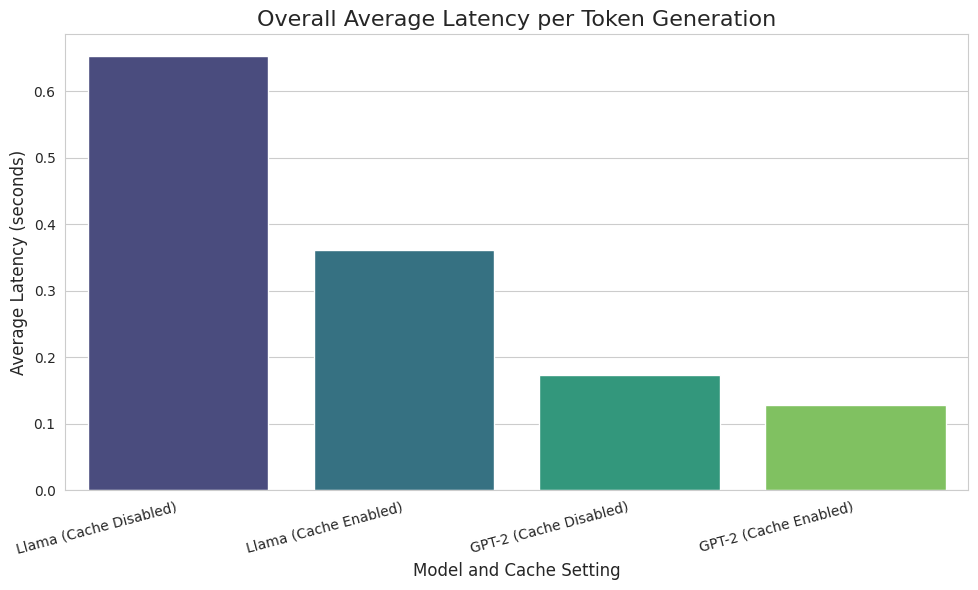

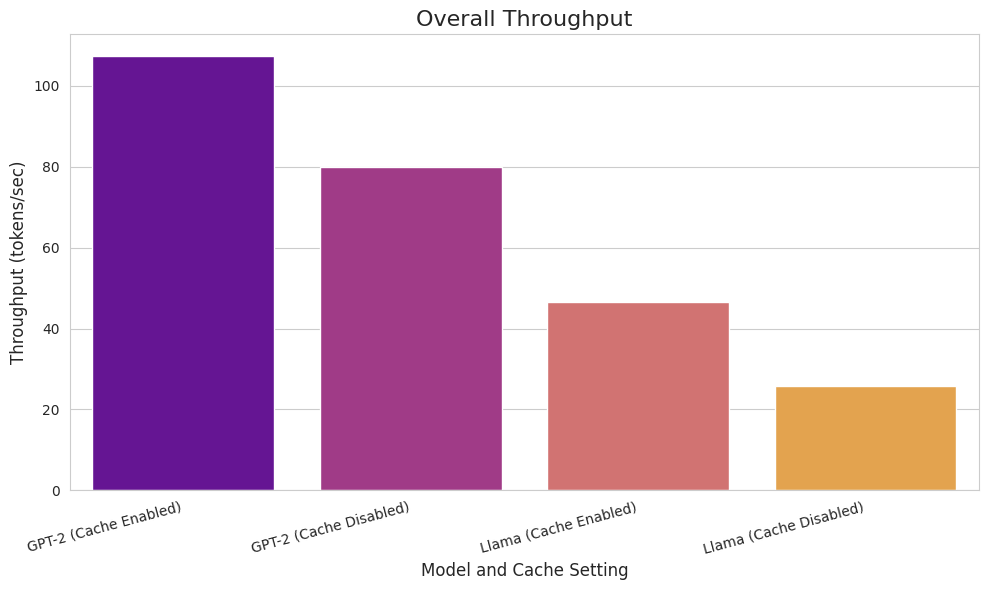

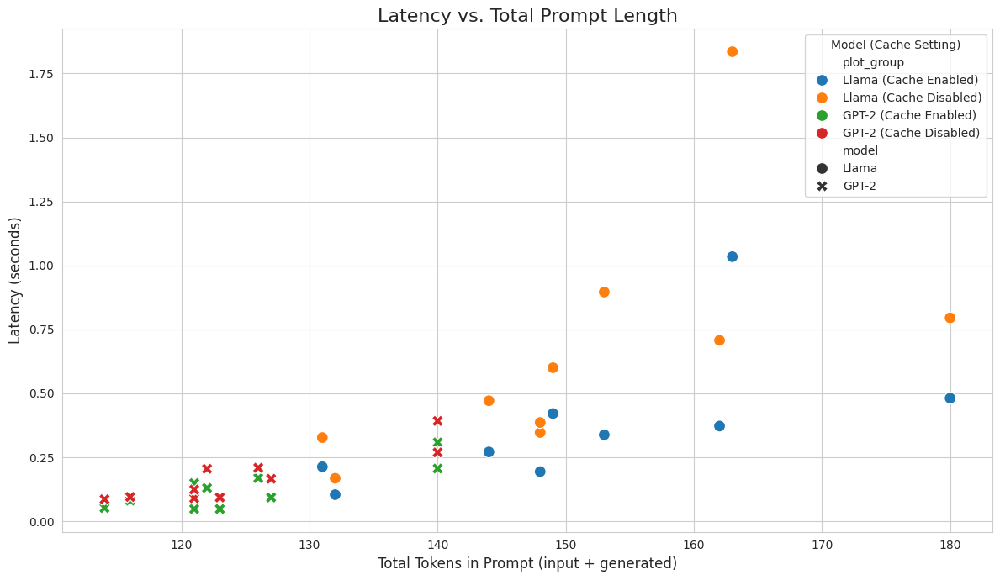

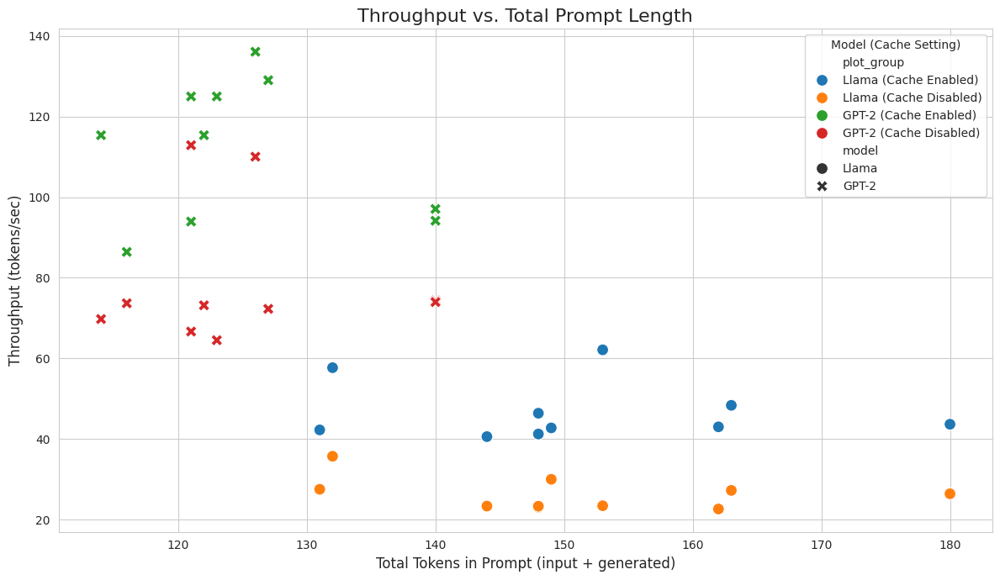

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- Step 1: Load and Prepare Data ---

# Directly specify the filenames as requested
llama_file = 'kv_cache_results_llama_20250906_112931.xlsx'
gpt_file = 'kv_cache_results_gpt2_20250906_110353.xlsx'

try:
    print(f"Loading Llama data from: {llama_file}")
    print(f"Loading GPT-2 data from: {gpt_file}")

    # Load the data from the specific Excel files
    df_llama = pd.read_excel(llama_file)
    df_llama['model'] = 'Llama'

    df_gpt = pd.read_excel(gpt_file)
    df_gpt['model'] = 'GPT-2' # Using GPT-2 to match the filename

    # Combine the dataframes into a single one for easier plotting
    df_combined = pd.concat([df_llama, df_gpt], ignore_index=True)

    # --- Step 2: Process Data for Plotting ---

    # Create a descriptive column for the cache setting
    df_combined['cache_setting'] = df_combined['cache_enabled'].apply(lambda x: 'Cache Enabled' if x else 'Cache Disabled')
    
    # Create a combined group column for easier plotting with seaborn
    df_combined['plot_group'] = df_combined['model'] + ' (' + df_combined['cache_setting'] + ')'

    # Separate the summary data (overall stats) from the per-prompt data
    summary_df = df_combined[df_combined['prompt_id'] == 'SUMMARY'].copy()
    per_prompt_df = df_combined[df_combined['prompt_id'] != 'SUMMARY'].copy()
    
    # Calculate per-prompt throughput for detailed plots
    # First, ensure columns are numeric and handle potential errors
    per_prompt_df['time_taken_sec'] = pd.to_numeric(per_prompt_df['time_taken_sec'], errors='coerce')
    per_prompt_df['generated_tokens'] = pd.to_numeric(per_prompt_df['generated_tokens'], errors='coerce')
    
    # Drop any rows where conversion failed
    per_prompt_df = per_prompt_df.dropna(subset=['time_taken_sec', 'generated_tokens'])

    # Calculate throughput, avoiding division by zero
    per_prompt_df['throughput'] = per_prompt_df.apply(
        lambda row: row['generated_tokens'] / row['time_taken_sec'] if row['time_taken_sec'] > 0 else 0, axis=1
    )

    # --- Step 3: Generate and Save Plots ---

    # Set a nice visual style for the plots
    sns.set_style("whitegrid")

    # Plot 1: Overall Average Latency (from summary data)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=summary_df.sort_values('avg_latency_sec', ascending=False), x='plot_group', y='avg_latency_sec', palette='viridis')
    plt.title('Overall Average Latency per Token Generation', fontsize=16)
    plt.xlabel('Model and Cache Setting', fontsize=12)
    plt.ylabel('Average Latency (seconds)', fontsize=12)
    plt.xticks(rotation=15, ha='right')
    plt.tight_layout()
    plt.savefig('overall_avg_latency.png')
    print("Saved plot: overall_avg_latency.png")

    # Plot 2: Overall Throughput (from summary data)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=summary_df.sort_values('throughput_tokens_per_sec', ascending=False), x='plot_group', y='throughput_tokens_per_sec', palette='plasma')
    plt.title('Overall Throughput', fontsize=16)
    plt.xlabel('Model and Cache Setting', fontsize=12)
    plt.ylabel('Throughput (tokens/sec)', fontsize=12)
    plt.xticks(rotation=15, ha='right')
    plt.tight_layout()
    plt.savefig('overall_throughput.png')
    print("Saved plot: overall_throughput.png")

    # Plot 3: Latency vs. Total Tokens (from per-prompt data)
    plt.figure(figsize=(12, 7))
    sns.scatterplot(data=per_prompt_df, x='total_tokens', y='time_taken_sec', hue='plot_group', style='model', s=100)
    plt.title('Latency vs. Total Prompt Length', fontsize=16)
    plt.xlabel('Total Tokens in Prompt (input + generated)', fontsize=12)
    plt.ylabel('Latency (seconds)', fontsize=12)
    plt.legend(title='Model (Cache Setting)')
    plt.tight_layout()
    plt.savefig('latency_vs_total_prompt_length.png')
    print("Saved plot: latency_vs_total_prompt_length.png")

    # Plot 4: Throughput vs. Input Tokens (from per-prompt data)
    plt.figure(figsize=(12, 7))
    sns.scatterplot(data=per_prompt_df, x='total_tokens', y='throughput', hue='plot_group', style='model', s=100)
    plt.title('Throughput vs. Total Prompt Length', fontsize=16)
    plt.xlabel('Total Tokens in Prompt (input + generated)', fontsize=12)
    plt.ylabel('Throughput (tokens/sec)', fontsize=12)
    plt.legend(title='Model (Cache Setting)')
    plt.tight_layout()
    plt.savefig('throughput_vs_total_prompt_length.png')
    print("Saved plot: throughput_vs_total_prompt_length.png")

except FileNotFoundError as e:
    print(f"Error: A specified Excel file was not found.")
    print(f"Please make sure these files are in the same directory as your script:")
    print(f" - {llama_file}")
    print(f" - {gpt_file}")
    print(f"Details: {e}")

#  KV Compression

In [17]:
import torch
import time
import numpy as np
import pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer
from evaluate import load
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
from datetime import datetime
import math


## GPT2

In [25]:
# --- 1. Utility Functions ---
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer
import math
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
import numpy as np


def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    """Calculates perplexity by evaluating the model's loss on the input text."""
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)
        target_ids = input_ids.clone()
        target_ids[target_ids == tokenizer.pad_token_id] = -100
        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss
            # count only valid tokens (exclude masked ones)
            num_tokens = (target_ids != -100).sum().item()
            if num_tokens > 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity


def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()


# --- 2. Graph-Based Compression Module ---

class CompressionModule:
    """Handles the compression and decompression of KV cache tensors."""
    def __init__(self, epsilon, device):
        self.epsilon = epsilon
        self.device = device

    def _compress_single_tensor(self, tensor_state):
        num_heads, seq_len, head_dim = tensor_state.shape
        if seq_len <= 1:
            return ([tensor_state[h].unsqueeze(0) for h in range(num_heads)],
                    [torch.zeros(seq_len, dtype=torch.long, device=self.device) for _ in range(num_heads)])

        all_head_centroids, all_head_mappings = [], []
        for h in range(num_heads):
            head_tensor = tensor_state[h, :, :].cpu().numpy()
            distances = squareform(pdist(head_tensor, 'euclidean'))
            adjacency_matrix = distances < self.epsilon
            n_components, labels = connected_components(csgraph=adjacency_matrix, directed=False, return_labels=True)

            centroids = np.zeros((n_components, head_dim))
            for i in range(n_components):
                cluster_nodes = head_tensor[labels == i]
                if cluster_nodes.shape[0] > 0:
                    centroids[i] = cluster_nodes.mean(axis=0)

            all_head_centroids.append(torch.tensor(centroids, dtype=tensor_state.dtype, device=self.device))
            all_head_mappings.append(torch.tensor(labels, dtype=torch.long, device=self.device))
        return all_head_centroids, all_head_mappings

    def _decompress_single_tensor(self, centroids_list, mappings_list):
        decompressed_heads = [centroids[mapping] for centroids, mapping in zip(centroids_list, mappings_list)]
        return torch.stack(decompressed_heads)

    def compress_kv_cache(self, past_key_values):
        return [(self._compress_single_tensor(k.squeeze(0)), self._compress_single_tensor(v.squeeze(0))) for k, v in past_key_values]

    def decompress_kv_cache(self, compressed_cache):
        return tuple((self._decompress_single_tensor(*k).unsqueeze(0), self._decompress_single_tensor(*v).unsqueeze(0)) for k, v in compressed_cache)


# --- 3. Main Benchmark Orchestrator ---

def run_benchmark(model, tokenizer, prompt_texts, name="gpt2"):
    """Runs a benchmark comparing standard, no-cache, and a smarter compressed cache."""
    device = model.device
    epsilon = 2.0
    COMPRESSION_INTERVAL = 5
    compression_module = CompressionModule(epsilon=epsilon, device=device)
    max_new_tokens = 50
    all_results = []

    print(f"Benchmark Settings: Epsilon={epsilon}, Compression Interval={COMPRESSION_INTERVAL} tokens")

    # --- Warmup ---
    print("Warming up model...")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for use_cache_warmup in [False, True]:
        for _ in range(2):
            with torch.no_grad():
                model.generate(**warmup_inputs, max_new_tokens=5, use_cache=use_cache_warmup)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")

    modes_to_test = ['compressed_cache', 'standard_cache', 'no_cache']
    cached_throughput, cached_avg_latency = 0, 0

    for mode in modes_to_test:
        print(f"--- Evaluating with Mode: {mode.upper()} ---")
        times, total_generated_tokens = [], 0
        
        generated_texts_for_ppl = []

        hooks = []
        if mode == 'no_cache':
            def make_hook(layer_id):
                def hook(module, input, output):
                    hidden_states = input[0]
                    q, k, v = module.c_attn(hidden_states).split(module.split_size, dim=2)
                    captured_kv_history.append({"layer": layer_id, "k_mem": get_tensor_size_bytes(k), "v_mem": get_tensor_size_bytes(v)})
                return hook
            for i, block in enumerate(model.transformer.h):
                h = block.attn.register_forward_hook(make_hook(i))
                hooks.append(h)

        for i, prompt in enumerate(prompt_texts):
            inputs = tokenizer(prompt, return_tensors="pt").to(device)
            input_len = inputs.input_ids.shape[1]
            
            print(f"Prompt: {i} ", prompt)
            print(f"Input tokens: {input_len}")

            torch.manual_seed(42)
            captured_kv_history = []
            
            compressed = None

            start_time = time.time()
            with torch.no_grad():
                if mode == 'compressed_cache':
                    input_ids = inputs.input_ids
                    past_key_values = None
                    for step in range(max_new_tokens):
                        model_inputs = {'input_ids': input_ids[:, -1:], 'past_key_values': past_key_values, 'use_cache': True} if past_key_values else {'input_ids': input_ids}
                        outputs = model(**model_inputs)
                        next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                        input_ids = torch.cat([input_ids, next_token], dim=-1)
                        if next_token.item() == tokenizer.eos_token_id:
                            break
                        past_key_values = outputs.past_key_values
                        if (step + 1) % COMPRESSION_INTERVAL == 0:
                            compressed = compression_module.compress_kv_cache(past_key_values)
                            past_key_values = compression_module.decompress_kv_cache(compressed)
                    sequences = input_ids
                else:
                    use_cache_flag = (mode == 'standard_cache')
                    outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, min_new_tokens=5, use_cache=use_cache_flag,
                                           do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                           return_dict_in_generate=True, output_scores=True)
                    sequences = outputs.sequences

            if torch.cuda.is_available():
                torch.cuda.synchronize()
            elapsed_time = time.time() - start_time

            generated_tokens = sequences.shape[1] - input_len
            total_generated_tokens += generated_tokens
            times.append(elapsed_time)
            
            full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
            generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
            generated_texts_for_ppl.append(full_generated_text)

            print(f"Generated tokens: {generated_tokens}")
            print(f"Time taken: {elapsed_time:.3f} seconds")
            print(f"Generated part only: {repr(generated_part_text)}")
            print("-" * 50)

            # --- Per-prompt data collection ---
            total_kv_bytes = 0
            if mode == 'standard_cache':
                print("\nKV Cache Shapes and Sizes per Layer (final state):")
                past_key_values = outputs.past_key_values
                for layer_idx, (k, v) in enumerate(past_key_values):
                    layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                    total_kv_bytes += layer_bytes
                    print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
                print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
            
            elif mode == 'compressed_cache':
                if compressed:
                    print("\nKV Cache Sizes per Layer (COMPRESSED state):")
                    for layer_idx, (compressed_k, compressed_v) in enumerate(compressed):
                        k_centroids_bytes = sum(get_tensor_size_bytes(t) for t in compressed_k[0])
                        k_mappings_bytes = sum(get_tensor_size_bytes(t) for t in compressed_k[1])
                        v_centroids_bytes = sum(get_tensor_size_bytes(t) for t in compressed_v[0])
                        v_mappings_bytes = sum(get_tensor_size_bytes(t) for t in compressed_v[1])
                        layer_bytes = k_centroids_bytes + k_mappings_bytes + v_centroids_bytes + v_mappings_bytes
                        total_kv_bytes += layer_bytes
                        num_k_centroids = sum(c.shape[0] for c in compressed_k[0])
                        num_v_centroids = sum(c.shape[0] for c in compressed_v[0])
                        seq_len = compressed_k[1][0].shape[0]
                        print(f"  Layer {layer_idx}: K (centroids={num_k_centroids}, seq={seq_len}), V (centroids={num_v_centroids}, seq={seq_len}), Size: {layer_bytes/1024:.2f} KiB")
                    print(f"Total COMPRESSED KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
                else:
                     print("\nNo compression was applied in this run (sequence too short).\n")

            elif mode == 'no_cache':
                print("\nKV Shapes and Sizes per Layer (captured at each step):")
                stepwise = {}
                for record in captured_kv_history:
                    layer = record["layer"]
                    kv_size = (record["k_mem"] + record["v_mem"])
                    stepwise.setdefault(layer, []).append(kv_size)
                    total_kv_bytes += kv_size
                for layer, sizes in stepwise.items():
                    print(f"  Layer {layer}: step KV sizes (KiB) = {[round(s / 1024, 2) for s in sizes]}")
                print(f"Total KV Computation Across All Steps/Layers: {total_kv_bytes/1024/1024:.2f} MiB\n")

            ## MODIFIED ## - Switched to the more detailed dictionary structure for saving to Excel.
            output_len = sequences.shape[1]
            result_row = {
                'mode': mode,
                'prompt_id': i,
                'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                'input_tokens': input_len,
                'generated_tokens': generated_tokens,
                'total_tokens': output_len,
                'time_taken_sec': round(elapsed_time, 3),
                'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text
            }
            all_results.append(result_row)


        for h in hooks: h.remove()

        # --- Mode Summary Calculation ---
        avg_latency, std_latency, total_time = np.mean(times), np.std(times), sum(times)
        throughput = total_generated_tokens / total_time if total_time > 0 else 0
        
        print("Calculating perplexity on generated texts...")
        perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)

        print(f"\nSummary for mode={mode}:")
        print(f"Average Latency: {avg_latency:.3f} ± {std_latency:.3f} sec")
        print(f"Throughput: {throughput:.2f} tokens/sec")
        print(f"Perplexity on generated outputs: {perplexity_score:.4f}")
        print("="*60 + "\n")

        ## MODIFIED ## - Switched to the more detailed dictionary structure for the summary row.
        summary_row = {
            'mode': mode, 'prompt_id': 'SUMMARY', 'prompt_text': f'Summary for mode={mode}',
            'input_tokens': '', 'generated_tokens': total_generated_tokens, 'total_tokens': '',
            'time_taken_sec': round(total_time, 3), 'kv_cache_size_kib': '',
            'avg_latency_sec': round(avg_latency, 3), 'std_latency_sec': round(std_latency, 3),
            'throughput_tokens_per_sec': round(throughput, 2),
            'avg_perplexity': round(perplexity_score, 4) if perplexity_score != float('inf') else 'N/A',
            'generated_part': f'Total generated: {total_generated_tokens} tokens'
        }
        all_results.append(summary_row)


        if mode == 'standard_cache':
            cached_throughput, cached_avg_latency = throughput, avg_latency
        elif mode == 'no_cache':
            print("-" * 20)
            if cached_throughput > 0 and throughput > 0:
                print(f"--> Throughput Speedup Factor (standard vs no-cache): {cached_throughput / throughput:.2f}x")
            if cached_avg_latency > 0 and avg_latency > 0:
                latency_speedup = avg_latency / cached_avg_latency
                print(f"--> Average Latency Speedup Factor: {latency_speedup:.2f}x")

    # --- Save Final Report ---
    df = pd.DataFrame(all_results).fillna('')
    filename = f"benchmark_results_{name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.xlsx"
    df.to_excel(filename, index=False)
    print(f"Benchmark complete. Results saved to {filename}")

In [26]:
run_benchmark(gpt2_model, gpt2_tokenizer, prompt_texts[:10], name="gpt2")

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Benchmark Settings: Epsilon=2.0, Compression Interval=5 tokens
Warming up model...
Warmup complete

--- Evaluating with Mode: COMPRESSED_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you 

KeyboardInterrupt: 

## LLAMA

!!! HAVE TO FIX THIS !!!

In [36]:
import torch
import time
import numpy as np
import pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer, LlamaForCausalLM, LlamaTokenizer
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
from sklearn.cluster import MiniBatchKMeans
from datetime import datetime
import math
# Import the DynamicCache object required by Llama models
from transformers.cache_utils import DynamicCache

In [37]:
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    """Calculates perplexity by evaluating the model's loss on the input text."""
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text: continue
        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)
        target_ids = input_ids.clone()
        target_ids[target_ids == tokenizer.pad_token_id] = -100
        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            num_tokens = (target_ids != -100).sum().item()
            total_loss += outputs.loss.item() * num_tokens
            total_tokens += num_tokens
    if total_tokens == 0: return float("inf")
    return math.exp(total_loss / total_tokens)

def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()

# --- 2. Compression Strategy Classes ---

class BaseCompressionStrategy:
    """Base class for different compression strategies."""
    def __init__(self, device, attention_sink_size=4, **kwargs):
        self.device = device
        # OPTIMIZATION 2: Implement Attention Sinks
        self.attention_sink_size = attention_sink_size

    def compress_kv_cache(self, past_key_values):
        raise NotImplementedError

    def decompress_kv_cache(self, compressed_cache):
        raise NotImplementedError

    def _decompress_single_tensor(self, centroids_list, mappings_list):
        # Common decompression logic for clustering-based methods
        decompressed_heads = [centroids[mapping] for centroids, mapping in zip(centroids_list, mappings_list)]
        return torch.stack(decompressed_heads)

class KMeansCompressionStrategy(BaseCompressionStrategy):
    """Compresses using MiniBatch K-Means clustering. Returns a tuple for GPT-2."""
    def __init__(self, device, compression_ratio=0.5, **kwargs):
        super().__init__(device, **kwargs)
        self.compression_ratio = compression_ratio

    def compress_kv_cache(self, past_key_values):
        compressed_layers = []
        for k_layer, v_layer in past_key_values:
            # Separate the attention sink from the part to be compressed
            k_sink, k_rest = k_layer[:, :, :self.attention_sink_size, :], k_layer[:, :, self.attention_sink_size:, :]
            v_sink, v_rest = v_layer[:, :, :self.attention_sink_size, :], v_layer[:, :, self.attention_sink_size:, :]
            
            # Only compress if there's something to compress
            if k_rest.shape[2] > 0:
                 k_compressed = self._compress_single_tensor(k_rest.squeeze(0))
                 v_compressed = self._compress_single_tensor(v_rest.squeeze(0))
                 compressed_layers.append(((k_sink, k_compressed), (v_sink, v_compressed)))
            else: # If only sink exists, don't compress
                 compressed_layers.append(((k_sink, None), (v_sink, None)))
        return compressed_layers


    def decompress_kv_cache(self, compressed_cache):
        decompressed_list = []
        for (k_sink, k_comp), (v_sink, v_comp) in compressed_cache:
            if k_comp is not None:
                k_decompressed_rest = self._decompress_single_tensor(*k_comp).unsqueeze(0)
                v_decompressed_rest = self._decompress_single_tensor(*v_comp).unsqueeze(0)
                # Combine sink and decompressed parts
                k_final = torch.cat([k_sink, k_decompressed_rest], dim=2)
                v_final = torch.cat([v_sink, v_decompressed_rest], dim=2)
            else: # No compressed part, just use the sink
                k_final, v_final = k_sink, v_sink

            decompressed_list.append((k_final, v_final))
        return tuple(decompressed_list)


    def _compress_single_tensor(self, tensor_state):
        num_heads, seq_len, head_dim = tensor_state.shape
        n_clusters = max(1, int(seq_len * self.compression_ratio))
        if n_clusters >= seq_len: # No compression possible
             return ([tensor_state[h] for h in range(num_heads)], [torch.arange(seq_len, device=self.device) for _ in range(num_heads)])

        all_head_centroids, all_head_mappings = [], []
        for h in range(num_heads):
            head_tensor = tensor_state[h, :, :].cpu().numpy()
            kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42, n_init='auto', batch_size=256)
            kmeans.fit(head_tensor)
            centroids = torch.tensor(kmeans.cluster_centers_, dtype=tensor_state.dtype, device=self.device)
            mappings = torch.tensor(kmeans.labels_, dtype=torch.long, device=self.device)
            all_head_centroids.append(centroids)
            all_head_mappings.append(mappings)
        return all_head_centroids, all_head_mappings

class LlamaKMeansCompressionStrategy(KMeansCompressionStrategy):
    """K-Means strategy that reconstructs the Llama-compatible DynamicCache object."""
    def decompress_kv_cache(self, compressed_cache):
        decompressed_list = []
        for (k_sink, k_comp), (v_sink, v_comp) in compressed_cache:
            if k_comp is not None:
                k_decompressed_rest = self._decompress_single_tensor(*k_comp).unsqueeze(0)
                v_decompressed_rest = self._decompress_single_tensor(*v_comp).unsqueeze(0)
                k_final = torch.cat([k_sink, k_decompressed_rest], dim=2)
                v_final = torch.cat([v_sink, v_decompressed_rest], dim=2)
            else:
                k_final, v_final = k_sink, v_sink
            decompressed_list.append((k_final, v_final))
        
        cache = DynamicCache()
        cache.key_cache = [k for k, v in decompressed_list]
        cache.value_cache = [v for k, v in decompressed_list]
        return cache


# --- 3. Main Benchmark Orchestrator ---

def run_benchmark(model, tokenizer, prompt_texts, name="gpt2"):
    device = model.device
    max_new_tokens = 50
    all_results = []
    
    COMPRESSION_INTERVAL = 16
    print(f"Benchmark Settings: Compression Interval={COMPRESSION_INTERVAL} tokens")
    
    # --- Warmup ---
    print("Warming up model...")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for use_cache_warmup in [True, False]:
        for _ in range(2):
            with torch.no_grad(): model.generate(**warmup_inputs, max_new_tokens=5, use_cache=use_cache_warmup)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")

    modes_to_test = ['kmeans_compressed_cache', 'standard_cache', 'no_cache']
    cached_throughput = 0
    is_llama = "llama" in model.config.model_type.lower()
    print(f"Model detected as Llama: {is_llama}")


    for mode in modes_to_test:
        print(f"--- Evaluating with Mode: {mode.upper()} ---")
        times, total_generated_tokens = [], 0
        
        # --- Strategy Selection ---
        compression_strategy = None
        if mode == 'kmeans_compressed_cache':
            compression_strategy = LlamaKMeansCompressionStrategy(device, compression_ratio=0.5) if is_llama else KMeansCompressionStrategy(device, compression_ratio=0.5)
        
        for i, prompt in enumerate(prompt_texts):
            inputs = tokenizer(prompt, return_tensors="pt").to(device)
            input_len = inputs.input_ids.shape[1]
            print(f"Prompt: {prompt[:80]}...")
            torch.manual_seed(42)
            
            start_time = time.time()
            with torch.no_grad():
                if compression_strategy:
                    input_ids = inputs.input_ids
                    past_key_values = None
                    for step in range(max_new_tokens):
                        model_inputs = {'input_ids': input_ids[:, -1:], 'past_key_values': past_key_values, 'use_cache': True} if past_key_values else {'input_ids': input_ids}
                        outputs = model(**model_inputs)
                        next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                        input_ids = torch.cat([input_ids, next_token], dim=-1)
                        
                        # OPTIMIZATION 1: Early stopping
                        if next_token.item() == tokenizer.eos_token_id:
                            break
                        
                        past_key_values = outputs.past_key_values
                        
                        if (step + 1) % COMPRESSION_INTERVAL == 0:
                            compressed = compression_strategy.compress_kv_cache(past_key_values)
                            past_key_values = compression_strategy.decompress_kv_cache(compressed)
                    sequences = input_ids
                else: 
                    use_cache_flag = (mode == 'standard_cache')
                    outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, min_new_tokens=5, use_cache=use_cache_flag,
                                           do_sample=False, pad_token_id=tokenizer.eos_token_id)
                    sequences = outputs

            if torch.cuda.is_available(): torch.cuda.synchronize()
            elapsed_time = time.time() - start_time
            
            generated_tokens = sequences.shape[1] - input_len
            total_generated_tokens += generated_tokens
            times.append(elapsed_time)
            generated_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
            print(f"Generated {generated_tokens} tokens in {elapsed_time:.3f}s. Generated part: {repr(generated_text[:80])}...\n")

        # --- Mode Summary Calculation ---
        total_time = sum(times)
        throughput = total_generated_tokens / total_time if total_time > 0 else 0
        perplexity_score = calculate_perplexity(model, tokenizer, prompt_texts, device)
        print(f"Summary for mode={mode}: Throughput: {throughput:.2f} tokens/sec, Perplexity: {perplexity_score:.4f}\n" + "="*60 + "\n")
        all_results.append({'mode': f'SUMMARY_{mode}', 'avg_perplexity': round(perplexity_score, 4), 'throughput_tokens_per_sec': round(throughput, 2)})
        if mode == 'standard_cache': cached_throughput = throughput
        elif mode == 'no_cache' and cached_throughput > 0 and throughput > 0:
            print(f"--> Throughput Speedup Factor (standard vs no-cache): {cached_throughput / throughput:.2f}x")

    # --- Save Final Report ---
    df = pd.DataFrame(all_results).fillna('')
    filename = f"benchmark_results_{name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.xlsx"
    df.to_excel(filename, index=False)
    print(f"Benchmark complete. Results saved to {filename}")

In [38]:
run_benchmark(llama_model, llama_tokenizer, prompt_texts[:10], name="llama")

Benchmark Settings: Compression Interval=16 tokens
Warming up model...
Warmup complete

Model detected as Llama: True
--- Evaluating with Mode: KMEANS_COMPRESSED_CACHE ---
Prompt: Robert Boulter is an English film , television and theatre actor . He had a gues...
Generated 11 tokens in 0.158s. Generated part: 'who had previously appeared in the series . \n'...

Prompt: In 2006 , Boulter starred alongside Whishaw in the play Citizenship written by M...
Generated 21 tokens in 8.274s. Generated part: 'part documentary , The Secret of the Fatigators , produced by the BBC . \n'...

Prompt: In 2000 Boulter had a guest @-@ starring role on the television series The Bill ...
Generated 18 tokens in 3.478s. Generated part: 'Jules Remix , playing the character of the thief Tommy Murphy . \n'...

Prompt: He had a recurring role in 2003 on two episodes of The Bill , as character " Con...
Generated 8 tokens in 0.146s. Generated part: 'Gielgud . \n'...

Prompt: In 2006 Boulter starred in the play Cit

## Epsilon vs Perplexity

### GPT2

In [17]:
# --- 1. Utility Functions ---
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer
import math
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
import numpy as np
import matplotlib.pyplot as plt


def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    """Calculates perplexity by evaluating the model's loss on the input text."""
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)
        target_ids = input_ids.clone()
        target_ids[target_ids == tokenizer.pad_token_id] = -100
        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss
            num_tokens = (target_ids != -100).sum().item()
            if num_tokens > 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity


def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()


# --- 2. Graph-Based Compression Module ---

class CompressionModule:
    """Handles the compression and decompression of KV cache tensors."""
    def __init__(self, epsilon, device):
        self.epsilon = epsilon
        self.device = device

    def _compress_single_tensor(self, tensor_state):
        num_heads, seq_len, head_dim = tensor_state.shape
        if seq_len <= 1:
            return ([tensor_state[h].unsqueeze(0) for h in range(num_heads)],
                    [torch.zeros(seq_len, dtype=torch.long, device=self.device) for _ in range(num_heads)])

        all_head_centroids, all_head_mappings = [], []
        for h in range(num_heads):
            head_tensor = tensor_state[h, :, :].cpu().numpy()
            distances = squareform(pdist(head_tensor, 'euclidean'))
            adjacency_matrix = distances < self.epsilon
            n_components, labels = connected_components(csgraph=adjacency_matrix, directed=False, return_labels=True)
            centroids = np.zeros((n_components, head_dim))
            for i in range(n_components):
                cluster_nodes = head_tensor[labels == i]
                if cluster_nodes.shape[0] > 0:
                    centroids[i] = cluster_nodes.mean(axis=0)
            all_head_centroids.append(torch.tensor(centroids, dtype=tensor_state.dtype, device=self.device))
            all_head_mappings.append(torch.tensor(labels, dtype=torch.long, device=self.device))
        return all_head_centroids, all_head_mappings

    def _decompress_single_tensor(self, centroids_list, mappings_list):
        decompressed_heads = [centroids[mapping] for centroids, mapping in zip(centroids_list, mappings_list)]
        return torch.stack(decompressed_heads)

    def compress_kv_cache(self, past_key_values):
        return [(self._compress_single_tensor(k.squeeze(0)), self._compress_single_tensor(v.squeeze(0))) for k, v in past_key_values]

    def decompress_kv_cache(self, compressed_cache):
        return tuple((self._decompress_single_tensor(*k).unsqueeze(0), self._decompress_single_tensor(*v).unsqueeze(0)) for k, v in compressed_cache)


# --- 3. MODIFIED BENCHMARK ORCHESTRATOR ---

def run_single_benchmark(model, tokenizer, prompt_texts, mode, device, 
                         epsilon=2.0, compression_interval=5, max_new_tokens=50):
    """
    Runs a benchmark for a SINGLE mode and returns a dictionary of summary results
    along with a list of per-prompt results.
    """
    print(f"--- Evaluating with Mode: {mode.upper()} (Epsilon: {epsilon if mode=='compressed_cache' else 'N/A'}) ---")
    
    compression_module = CompressionModule(epsilon=epsilon, device=device)
    times, total_generated_tokens = [], 0
    generated_texts_for_ppl = []
    all_prompt_results = []
    
    hooks = []
    if mode == 'no_cache':
        def make_hook(layer_id):
            def hook(module, input, output):
                hidden_states = input[0]
                q, k, v = module.c_attn(hidden_states).split(module.split_size, dim=2)
                captured_kv_history.append({"layer": layer_id, "k_mem": get_tensor_size_bytes(k), "v_mem": get_tensor_size_bytes(v)})
            return hook
        for i, block in enumerate(model.transformer.h):
            h = block.attn.register_forward_hook(make_hook(i))
            hooks.append(h)

    for i, prompt in enumerate(prompt_texts):
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        input_len = inputs.input_ids.shape[1]
        
        print(f"Prompt: {i} ", prompt)
        print(f"Input tokens: {input_len}")
        
        torch.manual_seed(42)
        captured_kv_history = []
        compressed = None

        start_time = time.time()
        with torch.no_grad():
            if mode == 'compressed_cache':
                input_ids = inputs.input_ids
                past_key_values = None
                for step in range(max_new_tokens):
                    model_inputs = {'input_ids': input_ids[:, -1:], 'past_key_values': past_key_values, 'use_cache': True} if past_key_values else {'input_ids': input_ids}
                    outputs = model(**model_inputs)
                    next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                    input_ids = torch.cat([input_ids, next_token], dim=-1)
                    if next_token.item() == tokenizer.eos_token_id:
                        break
                    past_key_values = outputs.past_key_values
                    if (step + 1) % compression_interval == 0:
                        compressed = compression_module.compress_kv_cache(past_key_values)
                        past_key_values = compression_module.decompress_kv_cache(compressed)
                sequences = input_ids
            else:
                use_cache_flag = (mode == 'standard_cache')
                outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, min_new_tokens=5, use_cache=use_cache_flag,
                                       do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                       return_dict_in_generate=True, output_scores=True)
                sequences = outputs.sequences

        if torch.cuda.is_available(): torch.cuda.synchronize()
        elapsed_time = time.time() - start_time
        
        generated_tokens = sequences.shape[1] - input_len
        total_generated_tokens += generated_tokens
        times.append(elapsed_time)
        
        full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
        generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
        generated_texts_for_ppl.append(full_generated_text)

        print(f"Generated tokens: {generated_tokens}")
        print(f"Time taken: {elapsed_time:.3f} seconds")
        print(f"Generated part only: {repr(generated_part_text)}")
        print("-" * 50)
        
        total_kv_bytes = 0
        if mode == 'standard_cache':
            print("\nKV Cache Shapes and Sizes per Layer (final state):")
            past_key_values = outputs.past_key_values
            for layer_idx, (k, v) in enumerate(past_key_values):
                layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                total_kv_bytes += layer_bytes
                print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
            print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
        elif mode == 'compressed_cache':
            if compressed:
                print("\nKV Cache Sizes per Layer (COMPRESSED state):")
                for layer_idx, (compressed_k, compressed_v) in enumerate(compressed):
                    k_centroids_bytes = sum(get_tensor_size_bytes(t) for t in compressed_k[0])
                    k_mappings_bytes = sum(get_tensor_size_bytes(t) for t in compressed_k[1])
                    v_centroids_bytes = sum(get_tensor_size_bytes(t) for t in compressed_v[0])
                    v_mappings_bytes = sum(get_tensor_size_bytes(t) for t in compressed_v[1])
                    layer_bytes = k_centroids_bytes + k_mappings_bytes + v_centroids_bytes + v_mappings_bytes
                    total_kv_bytes += layer_bytes
                    num_k_centroids = sum(c.shape[0] for c in compressed_k[0])
                    num_v_centroids = sum(c.shape[0] for c in compressed_v[0])
                    seq_len = compressed_k[1][0].shape[0]
                    print(f"  Layer {layer_idx}: K (centroids={num_k_centroids}, seq={seq_len}), V (centroids={num_v_centroids}, seq={seq_len}), Size: {layer_bytes/1024:.2f} KiB")
                print(f"Total COMPRESSED KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
            else:
                 print("\nNo compression was applied in this run (sequence too short).\n")
        elif mode == 'no_cache':
            print("\nKV Shapes and Sizes per Layer (captured at each step):")
            stepwise = {}
            for record in captured_kv_history:
                layer = record["layer"]
                kv_size = (record["k_mem"] + record["v_mem"])
                stepwise.setdefault(layer, []).append(kv_size)
                total_kv_bytes += kv_size
            for layer, sizes in stepwise.items():
                print(f"  Layer {layer}: step KV sizes (KiB) = {[round(s / 1024, 2) for s in sizes]}")
            print(f"Total KV Computation Across All Steps/Layers: {total_kv_bytes/1024/1024:.2f} MiB\n")
        
        output_len = sequences.shape[1]
        result_row = {
            'mode': mode, 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A', 'prompt_id': i,
            'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
            'input_tokens': input_len, 'generated_tokens': generated_tokens, 'total_tokens': output_len,
            'time_taken_sec': round(elapsed_time, 3),
            'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
            'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text
        }
        all_prompt_results.append(result_row)

    for h in hooks: h.remove()
    
    avg_latency = np.mean(times) if times else 0
    std_latency = np.std(times) if times else 0
    total_time = sum(times)
    throughput = total_generated_tokens / total_time if total_time > 0 else 0
    
    print("  Calculating perplexity...")
    perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)

    summary = {
        'mode': f"SUMMARY_{mode}", 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A',
        'avg_perplexity': round(perplexity_score, 4),
        'throughput_tokens_per_sec': round(throughput, 2),
        'avg_latency_sec': round(avg_latency, 3), 'std_latency_sec': round(std_latency, 3)
    }
    
    print(f"\nSummary for mode={mode} (Epsilon={epsilon if mode=='compressed_cache' else 'N/A'}):")
    print(f"  Average Latency: {avg_latency:.3f} ± {std_latency:.3f} sec")
    print(f"  Throughput: {throughput:.2f} tokens/sec")
    print(f"  Perplexity on generated outputs: {perplexity_score:.4f}")
    print("="*60 + "\n")
    
    return summary, all_prompt_results

## --- 4. NEW Plotting Function --- ##
def plot_results(plot_data, baseline_perplexity):
    """Generates and saves a plot of perplexity vs. epsilon."""
    if not plot_data:
        print("No data available for plotting.")
        return
        
    epsilons = [d['epsilon'] for d in plot_data]
    ## FIX 1 ## - Use the correct key 'avg_perplexity'
    perplexities = [d['avg_perplexity'] for d in plot_data]

    plt.figure(figsize=(10, 6))
    plt.plot(epsilons, perplexities, marker='o', linestyle='-', label='Compressed Cache')
    
    if baseline_perplexity is not None:
        plt.axhline(y=baseline_perplexity, color='r', linestyle='--', label=f'Standard Cache PPL ({baseline_perplexity:.4f})')

    plt.title('Perplexity vs. Epsilon for KV Cache Compression')
    plt.xlabel('Epsilon (Clustering Threshold)')
    plt.ylabel('Perplexity on Generated Text (Lower is Better)')
    plt.grid(True)
    plt.legend()
    
    plot_filename = f"perplexity_vs_epsilon_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
    plt.savefig(plot_filename)
    print(f"\nPlot saved to {plot_filename}")
    plt.show()


## --- 5. NEW Main Experiment Runner --- ##
def run_full_experiment(model, tokenizer, prompt_texts, name="gpt2"):
    """
    Main orchestrator to run benchmarks over multiple epsilon values and plot results.
    """
    device = model.device
    
    # --- Warmup ---
    print("--- Warming up model... ---")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for use_cache_warmup in [False, True]:
        for _ in range(2):
            with torch.no_grad():
                model.generate(**warmup_inputs, max_new_tokens=5, use_cache=use_cache_warmup)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")

    all_results_df = pd.DataFrame()

    # --- Run Baselines ---
    standard_cache_summary, standard_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'standard_cache', device)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(standard_prompt_results)], ignore_index=True)
    
    no_cache_summary, no_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'no_cache', device)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(no_prompt_results)], ignore_index=True)

    # --- Run Epsilon Sweep for Compressed Cache ---
    epsilon_values = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0] 
    compression_summaries = []
    
    for epsilon in epsilon_values:
        summary, prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'compressed_cache', device,
                                                       epsilon=epsilon, compression_interval=5)
        compression_summaries.append(summary)
        all_results_df = pd.concat([all_results_df, pd.DataFrame(prompt_results)], ignore_index=True)

    # --- Final Plotting ---
    if compression_summaries:
        ## FIX 2 ## - Use the correct key 'avg_perplexity'
        plot_results(compression_summaries, standard_cache_summary['avg_perplexity'])

    # --- Save Full Report ---
    summary_df = pd.DataFrame([standard_cache_summary, no_cache_summary] + compression_summaries)
    
    # Detailed per-prompt report
    detailed_filename = f"detailed_results_{name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.xlsx"
    all_results_df.to_excel(detailed_filename, index=False)
    print(f"Full detailed experiment results saved to {detailed_filename}")
    
    # Summary report
    summary_filename = f"summary_results_{name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.xlsx"
    summary_df.to_excel(summary_filename, index=False)
    print(f"Summary of experiment results saved to {summary_filename}")

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


--- Warming up model... ---


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Warmup complete

--- Evaluating with Mode: STANDARD_CACHE (Epsilon: N/A) ---
Prompt: 0  Robert Boulter is an English film , television and theatre actor . He had a guest @-@ starring role on the television series The Bill in 2000 . This was followed by a starring role in the play Herons written by Simon Stephens , which was performed in 2001 at the Royal Court Theatre . He had a guest role in the television series Judge John Deed in 2002 . In 2004 Boulter landed a role as " Craig " in the episode " Teddy 's Story " of the television series The Long Firm ; he starred alongside actors
Input tokens: 109
Generated tokens: 7
Time taken: 0.064 seconds
Generated part only: ' from the show . \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state):
  Layer 0: K torch.Size([1, 12, 115, 64]), V torch.Size([1, 12, 115, 64]), Size: 690.00 KiB
  Layer 1: K torch.Size([1, 12, 115, 64]), V torch.Size([1, 12, 115, 64]), Size: 690.00 KiB
  Layer 2: K tor

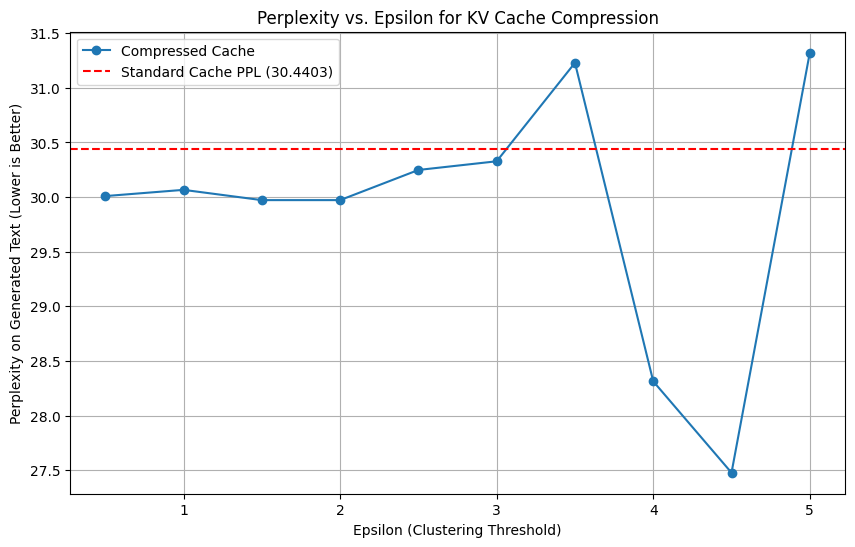

Full detailed experiment results saved to detailed_results_gpt2_20250909_143536.xlsx
Summary of experiment results saved to summary_results_gpt2_20250909_143536.xlsx


In [18]:
run_full_experiment(gpt2_model, gpt2_tokenizer, prompt_texts[:10], name="gpt2")

# Optimized

In [15]:
pip install cugraph-cu12 cudf-cu12 --extra-index-url=https://pypi.nvidia.com --break-system-packages --user

Looking in indexes: https://pypi.org/simple, https://pypi.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [20]:
# --- 1. Utility Functions ---
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer
from transformers.cache_utils import DynamicCache, Cache
import math
import matplotlib.pyplot as plt

@torch._dynamo.disable
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    """Calculates perplexity by evaluating the model's loss on the input text."""
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)
        target_ids = input_ids.clone()
        if tokenizer.pad_token_id is not None:
            target_ids[target_ids == tokenizer.pad_token_id] = -100
        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss
            num_tokens = (target_ids != -100).sum().item()
            if num_tokens > 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()

def extract_kv_pairs(past_key_values: Cache) -> list:
    """Helper to extract a list of (k, v) 4D tensors from a Cache object."""
    kv_pairs = []
    # The past_key_values object is an iterable of layers, where each layer is a tuple of (key, value)
    for layer_cache in past_key_values:
        kv_pairs.append(layer_cache)
    return kv_pairs

def rebuild_cache(pruned_kv_list: list, is_llama: bool) -> Cache:
    """Rebuilds a Cache object from a list of pruned (k,v) tensors."""
    if is_llama:
        return DynamicCache.from_legacy_cache(past_key_values=tuple(pruned_kv_list))
    else: # For GPT-2, return a standard tuple
        return tuple(pruned_kv_list)

# --- 2. Hybrid Pruning Module (Sink + Clustering) ---
class HybridCompressionModule:
    """
    Combines Attention Sinks for stability with Graph Clustering for intelligent pruning.
    This module is architecture-agnostic and works for both GPT-2 and Llama.
    """
    def __init__(self, epsilon: float, num_sink_tokens: int, device: str, clustering_iterations=20):
        self.epsilon = epsilon
        self.num_sink_tokens = num_sink_tokens
        self.device = device
        self.clustering_iterations = clustering_iterations

    def _gpu_connected_components(self, adj_matrix):
        num_heads, seq_len, _ = adj_matrix.shape
        labels = torch.arange(seq_len, device=self.device, dtype=torch.long).unsqueeze(0).expand(num_heads, -1)
        adj_matrix_with_loops = adj_matrix | torch.eye(seq_len, device=self.device, dtype=torch.bool).unsqueeze(0)
        for _ in range(self.clustering_iterations):
            propagated_labels = torch.where(adj_matrix_with_loops, labels.unsqueeze(1), seq_len)
            min_neighbor_labels = torch.min(propagated_labels, dim=2).values
            new_labels = torch.min(labels, min_neighbor_labels)
            if torch.equal(labels, new_labels): break
            labels = new_labels
        return labels

    def _prune_kv_pair(self, k_state_4d, v_state_4d):
        """
        Prunes a single layer's KV pair using clustering with centroids.
        k_state_4d, v_state_4d: (batch, num_heads, seq_len, head_dim)
        """
        batch_size, num_heads, seq_len, head_dim = k_state_4d.shape
    
        # If sequence is too short, no pruning
        if seq_len <= self.num_sink_tokens:
            return k_state_4d, v_state_4d
    
        # Keep sink tokens intact
        k_sink = k_state_4d[:, :, :self.num_sink_tokens, :]
        v_sink = v_state_4d[:, :, :self.num_sink_tokens, :]
    
        # Prunable tokens
        k_prunable = k_state_4d[:, :, self.num_sink_tokens:, :]  # (1, H, L', D)
        v_prunable = v_state_4d[:, :, self.num_sink_tokens:, :]
        k_prunable_3d = k_prunable.squeeze(0)  # (H, L', D)
        v_prunable_3d = v_prunable.squeeze(0)
    
        prunable_seq_len = k_prunable_3d.shape[1]
        if prunable_seq_len <= 1:
            return k_state_4d, v_state_4d
    
        # Pairwise distances between tokens
        distances = torch.cdist(k_prunable_3d, k_prunable_3d)  # (H, L', L')
        adjacency_matrix = distances < self.epsilon
    
        # Cluster labels via GPU connected components
        labels = self._gpu_connected_components(adjacency_matrix)
    
        # Remap labels per head (0..num_clusters-1)
        max_components = 0
        remapped_labels_list = []
        for h in range(num_heads):
            unique, inverse = torch.unique(labels[h], return_inverse=True)
            remapped_labels_list.append(inverse)
            if unique.numel() > max_components:
                max_components = unique.numel()
        remapped_labels = torch.stack(remapped_labels_list)  # (H, L')
    
        # Expand for scatter_add
        remapped_labels_exp = remapped_labels.unsqueeze(-1).expand(-1, -1, head_dim)  # (H, L', D)
    
        # --- BUG FIX START ---
        # The original code incorrectly initialized counts to 1. 
        # The correct method is to initialize to 0, count, then clamp before division.
    
        # 1. Initialize sum and count tensors to zeros
        centroids_sum_k = torch.zeros(
            (num_heads, max_components, head_dim),
            dtype=k_prunable_3d.dtype, device=self.device
        )
        centroids_sum_v = torch.zeros_like(centroids_sum_k)
        counts = torch.zeros(
            (num_heads, max_components), device=self.device, dtype=torch.long
        )
    
        # 2. Add 1 to the count for each token in its corresponding cluster
        counts.scatter_add_(1, remapped_labels, torch.ones_like(remapped_labels))
    
        # 3. Sum the K and V vectors for each cluster
        centroids_sum_k.scatter_add_(1, remapped_labels_exp, k_prunable_3d)
        centroids_sum_v.scatter_add_(1, remapped_labels_exp, v_prunable_3d)
        
        # 4. Clamp counts AFTER counting to prevent division by zero.
        #    Unsqueeze to make dimensions compatible for broadcasting during division.
        counts = counts.unsqueeze(-1).clamp(min=1)
    
        # 5. Compute centroids (the correct average)
        centroids_k = centroids_sum_k / counts
        centroids_v = centroids_sum_v / counts
        # --- BUG FIX END ---
    
        # Merge sink tokens + centroids
        final_k = torch.cat([k_sink, centroids_k.unsqueeze(0)], dim=2)  # (1, H, S + C, D)
        final_v = torch.cat([v_sink, centroids_v.unsqueeze(0)], dim=2)
    
        return final_k, final_v


    def compress_kv_cache(self, past_key_values: Cache, is_llama: bool) -> list:
        # GPT-2 uses a tuple, Llama uses a Cache object. We need to handle both.
        if is_llama:
            kv_pairs = extract_kv_pairs(past_key_values)
        else:
            kv_pairs = list(past_key_values)

        return [self._prune_kv_pair(k, v) for k, v in kv_pairs]

# --- 3. BENCHMARK ORCHESTRATOR ---
def run_single_benchmark(model, tokenizer, prompt_texts, mode, device,
                         epsilon=2.0, num_sink_tokens=4,
                         max_new_tokens=50, compression_interval=16,
                         standard_cache_sizes=None):
    print(f"--- Evaluating with Mode: {mode.upper()} ---")
    if mode == 'compressed_cache':
        print(f"      (Epsilon: {epsilon}, Sink: {num_sink_tokens} tokens, Interval: {compression_interval} tokens)")

    is_llama = "llama" in model.config.model_type.lower()
    if torch.cuda.is_available():
        torch.cuda.empty_cache(); torch.cuda.reset_peak_memory_stats()

    compression_module = HybridCompressionModule(epsilon, num_sink_tokens, device)
    times, total_generated_tokens, generated_texts_for_ppl, all_prompt_results = [], 0, [], []

    for i, prompt in enumerate(prompt_texts):
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        input_len = inputs.input_ids.shape[1]
        print(f"Prompt: {i} ", prompt)
        print(f"Input tokens: {input_len}")
        torch.manual_seed(42)
        
        start_time = time.time()
        
        with torch.no_grad():
            if mode == 'compressed_cache':
                generated_ids = inputs.input_ids
                attention_mask = inputs.attention_mask
                past_key_values = None

                for step in range(max_new_tokens):
                    if past_key_values is not None:
                        if is_llama:
                            current_seq_len = past_key_values.get_seq_length()
                        else:
                            current_seq_len = past_key_values[0][0].shape[2]
                        input_token = generated_ids[:, -1:]
                    else:
                        current_seq_len = generated_ids.shape[1]
                        input_token = generated_ids

                    model_inputs = {
                        'input_ids': input_token, 
                        'past_key_values': past_key_values, 
                        'use_cache': True,
                        'attention_mask': attention_mask
                    }
                    if is_llama:
                        model_inputs['cache_position'] = torch.arange(current_seq_len, current_seq_len + input_token.shape[1], device=device)

                    outputs = model(**model_inputs)
                    next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                    
                    if tokenizer.eos_token_id is not None and next_token.item() == tokenizer.eos_token_id:
                        break

                    generated_ids = torch.cat([generated_ids, next_token], dim=-1)
                    attention_mask = torch.cat([attention_mask, torch.ones((attention_mask.shape[0], 1), device=device, dtype=torch.long)], dim=1)
                    
                    past_key_values = outputs.past_key_values

                    num_generated = step + 1
                    if num_generated % compression_interval == 0 and past_key_values is not None:
                        pruned_kv_list = compression_module.compress_kv_cache(past_key_values, is_llama)
                        past_key_values = rebuild_cache(pruned_kv_list, is_llama)
                        if is_llama:
                            new_seq_len = past_key_values.get_seq_length()
                        else:
                            new_seq_len = past_key_values[0][0].shape[2]
                        
                        attention_mask = torch.ones((inputs.input_ids.shape[0], new_seq_len), device=device, dtype=torch.long)
                
                sequences = generated_ids
            else:
                use_cache_flag = (mode == 'standard_cache')
                if mode == 'no_cache':
                    use_cache_flag = False
                
                outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, use_cache=use_cache_flag,
                                         do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                         return_dict_in_generate=True, output_scores=True)
                sequences = outputs.sequences

        if torch.cuda.is_available(): torch.cuda.synchronize()
        elapsed_time = time.time() - start_time
        generated_tokens = sequences.shape[1] - input_len
        if generated_tokens <= 0: continue
        total_generated_tokens += generated_tokens
        times.append(elapsed_time)
        full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
        generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
        generated_texts_for_ppl.append(full_generated_text)
        print(f"Generated tokens: {generated_tokens}")
        print(f"Time taken: {elapsed_time:.3f} seconds")
        print(f"Generated part only: {repr(generated_part_text)}")
        print("-" * 50)

        total_kv_bytes = 0
        final_past_key_values = None
        if 'outputs' in locals() and hasattr(outputs, 'past_key_values') and outputs.past_key_values is not None:
            final_past_key_values = outputs.past_key_values
        elif 'past_key_values' in locals() and past_key_values is not None:
            final_past_key_values = past_key_values
            
        if final_past_key_values:
            kv_pairs = extract_kv_pairs(final_past_key_values) if is_llama else list(final_past_key_values)
            print(f"\nKV Cache Shapes and Sizes per Layer (final state, mode={mode}):")
            for layer_idx, (k, v) in enumerate(kv_pairs):
                layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                total_kv_bytes += layer_bytes
                print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
            print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
        
        memory_saving_kib = 0
        memory_saving_percent = 'N/A'
        
        if mode == 'compressed_cache' and standard_cache_sizes:
            standard_size_kib = standard_cache_sizes.get(i) # i is the prompt_id
            if standard_size_kib and isinstance(standard_size_kib, (int, float)) and standard_size_kib > 0:
                standard_size_bytes = standard_size_kib * 1024
                if total_kv_bytes > 0:
                    memory_saving_kib = (standard_size_bytes - total_kv_bytes) / 1024
                    saving_percent = (memory_saving_kib * 1024 / standard_size_bytes) * 100 if standard_size_bytes > 0 else 0
                    memory_saving_percent = round(saving_percent, 1)
                    
                    print(f"  --> Comparison with Standard Cache:")
                    print(f"      Standard Size  : {standard_size_kib:.2f} KiB")
                    print(f"      Compressed Size: {total_kv_bytes/1024:.2f} KiB")
                    print(f"      Saving         : {memory_saving_kib:.2f} KiB ({memory_saving_percent:.1f}%)\n")

        output_len = sequences.shape[1]
        result_row = {'mode': mode, 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A', 'prompt_id': i,
                      'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                      'input_tokens': input_len, 'generated_tokens': generated_tokens, 'total_tokens': output_len,
                      'time_taken_sec': round(elapsed_time, 3),
                      'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                      'kv_cache_saving_kib': round(memory_saving_kib, 2) if memory_saving_kib > 0 else 'N/A',
                      'kv_cache_saving_percent': memory_saving_percent,
                      'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text}
        all_prompt_results.append(result_row)
    
    avg_latency = np.mean(times) if times else 0
    std_latency = np.std(times) if times else 0
    total_time = sum(times)
    throughput = total_generated_tokens / total_time if total_time > 0 else 0
    peak_memory_mib = torch.cuda.max_memory_allocated() / 1024 / 1024 if torch.cuda.is_available() else 0
    
    avg_saving_kib = 0
    if mode == 'compressed_cache':
        savings = [r['kv_cache_saving_kib'] for r in all_prompt_results if isinstance(r['kv_cache_saving_kib'], (int, float)) and r['kv_cache_saving_kib'] != 'N/A']
        if savings: avg_saving_kib = np.mean(savings)

    print("  Calculating perplexity...")
    perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)
    summary = {'mode': f"SUMMARY_{mode}", 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A',
               'avg_perplexity': round(perplexity_score, 4),'throughput_tokens_per_sec': round(throughput, 2),
               'avg_latency_sec': round(avg_latency, 3),'std_latency_sec': round(std_latency, 3),
               'peak_memory_mib': round(peak_memory_mib, 2),
               'avg_memory_saving_kib': round(avg_saving_kib, 2)}

    print(f"\nSummary for mode={mode}:")
    print(f"  Average Latency: {summary['avg_latency_sec']:.3f} ± {summary['std_latency_sec']:.3f} sec")
    print(f"  Throughput: {summary['throughput_tokens_per_sec']:.2f} tokens/sec")
    print(f"  Perplexity on generated outputs: {summary['avg_perplexity']:.4f}")
    if peak_memory_mib > 0: print(f"  Peak Memory Usage for this mode: {summary['peak_memory_mib']:.2f} MiB")
    if avg_saving_kib > 0: print(f"  Average Memory Saving on successful savings (>0): {summary['avg_memory_saving_kib']:.2f} KiB")
    print("="*60 + "\n")
    return summary, all_prompt_results

# --- 4. Plotting Function ---
def plot_results(plot_data, baseline_summary, all_results_df):
    """
    Plots the benchmark results, showing performance vs. epsilon.
    Includes baseline comparisons and min/max annotations for each metric.
    Annotations now use simple text labels without arrows to avoid clutter.
    """
    if not plot_data:
        return

    epsilons = [d['epsilon'] for d in plot_data]
    perplexities = [d['avg_perplexity'] for d in plot_data]
    throughputs = [d['throughput_tokens_per_sec'] for d in plot_data]
    latencies = [d['avg_latency_sec'] for d in plot_data]

    baseline_perplexity = baseline_summary.get('avg_perplexity')
    baseline_throughput = baseline_summary.get('throughput_tokens_per_sec')
    baseline_latency = baseline_summary.get('avg_latency_sec')

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    fig.suptitle('KV Cache Compression Performance vs. Epsilon', fontsize=18)
    
    # --- Annotation styling for text labels ---
    text_bbox = dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.5, alpha=0.8) # Light background for readability
    text_props_min = {'fontsize': 9, 'color': 'darkgreen', 'ha': 'left', 'va': 'top'}
    text_props_max = {'fontsize': 9, 'color': 'darkred', 'ha': 'left', 'va': 'bottom'}
    offset_x = 0.5 # Small offset in x-direction for labels

    # ===================================================================
    # 1. Perplexity Plot
    # ===================================================================
    ax = axes[0, 0]
    ax.plot(epsilons, perplexities, marker='o', linestyle='-', color='b', label='Compressed Cache')
    if baseline_perplexity is not None:
        ax.axhline(y=baseline_perplexity, color='r', linestyle='--', label=f'Standard Cache PPL ({baseline_perplexity:.2f})')
    
    # --- Min/Max Annotations for Perplexity ---
    min_idx = np.argmin(perplexities)
    max_idx = np.argmax(perplexities)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, perplexities[min_idx],
            f'Min: {perplexities[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, perplexities[max_idx],
                f'Max: {perplexities[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Model Quality (Perplexity)')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Perplexity')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 2. Throughput Plot
    # ===================================================================
    ax = axes[0, 1]
    ax.plot(epsilons, throughputs, marker='s', linestyle='-', color='g', label='Compressed Cache')
    if baseline_throughput is not None:
        ax.axhline(y=baseline_throughput, color='r', linestyle='--', label=f'Standard Cache Thr. ({baseline_throughput:.2f})')

    # --- Min/Max Annotations for Throughput ---
    min_idx = np.argmin(throughputs)
    max_idx = np.argmax(throughputs)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, throughputs[min_idx],
            f'Min: {throughputs[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, throughputs[max_idx],
                f'Max: {throughputs[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Throughput')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Throughput (tokens/sec)')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 3. Latency Plot
    # ===================================================================
    ax = axes[1, 0]
    ax.plot(epsilons, latencies, marker='^', linestyle='-', color='purple', label='Compressed Cache')
    if baseline_latency is not None:
        ax.axhline(y=baseline_latency, color='r', linestyle='--', label=f'Standard Cache Lat. ({baseline_latency:.3f})')
        
    # --- Min/Max Annotations for Latency ---
    min_idx = np.argmin(latencies)
    max_idx = np.argmax(latencies)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, latencies[min_idx],
            f'Min: {latencies[min_idx]:.3f}s',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, latencies[max_idx],
                f'Max: {latencies[max_idx]:.3f}s',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Latency')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Average Latency (seconds)')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 4. Max Compression Percentage Plot
    # ===================================================================
    ax = axes[1, 1]
    max_compression_percentages = []
    if not all_results_df.empty:
        compressed_df = all_results_df[all_results_df['mode'] == 'compressed_cache'].copy()
        compressed_df['kv_cache_saving_percent'] = pd.to_numeric(compressed_df['kv_cache_saving_percent'], errors='coerce')
        if not compressed_df.empty:
            max_savings_by_epsilon = compressed_df.groupby('epsilon')['kv_cache_saving_percent'].max()
            max_compression_percentages = [max_savings_by_epsilon.get(eps, 0) for eps in epsilons]

    ax.plot(epsilons, max_compression_percentages, marker='d', linestyle='-', color='orange', label='Max Compression %')
    
    # --- Min/Max Annotations for Compression ---
    if max_compression_percentages:
        min_idx = np.argmin(max_compression_percentages)
        max_idx = np.argmax(max_compression_percentages)
        
        # Annotate Min
        ax.text(epsilons[min_idx] + offset_x, max_compression_percentages[min_idx],
                f'Min: {max_compression_percentages[min_idx]:.1f}%',
                bbox=text_bbox, **text_props_min)
        
        # Annotate Max (only if different from min)
        if min_idx != max_idx:
            ax.text(epsilons[max_idx] + offset_x, max_compression_percentages[max_idx],
                    f'Max: {max_compression_percentages[max_idx]:.1f}%',
                    bbox=text_bbox, **text_props_max)

    ax.set_title('Maximum Cache Compression vs. Epsilon')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Maximum Compression Saving (%)')
    ax.grid(True)
    ax.legend()
    
    # --- Final Touches ---
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plot_filename = "compression_metrics_vs_epsilon_llama_8.png" # Changed filename
    plt.savefig(plot_filename)
    print(f"\nMetrics plot saved to {plot_filename}")
    plt.show()


# --- 5. Main Experiment Runner ---
def run_full_experiment(model, tokenizer, prompt_texts, name="model"):
    device = model.device
    print("--- Warming up model... ---")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for _ in range(2):
        with torch.no_grad(): model.generate(**warmup_inputs, max_new_tokens=5, use_cache=True)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")
    
    all_results_df = pd.DataFrame()
    
    standard_cache_summary, standard_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'standard_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(standard_prompt_results)], ignore_index=True)

    standard_cache_sizes = {res['prompt_id']: res['kv_cache_size_kib'] for res in standard_prompt_results}
    
    no_cache_summary, no_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'no_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(no_prompt_results)], ignore_index=True)

    is_llama = "llama" in model.config.model_type.lower()
    if is_llama:
        epsilon_values = [0.5, 2.5, 5.0, 10.0,15.0, 20.0, 25.0, 30.0, 35.0, 40.0]
    else:
        epsilon_values = [0.5, 2.5, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, 35.0, 40.0]

    compression_summaries = []

    for epsilon in epsilon_values:
        summary, prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'compressed_cache', device,
                                                       epsilon=epsilon, 
                                                       num_sink_tokens=4, 
                                                       max_new_tokens=50, 
                                                       compression_interval=8,
                                                       standard_cache_sizes=standard_cache_sizes)
        compression_summaries.append(summary)
        all_results_df = pd.concat([all_results_df, pd.DataFrame(prompt_results)], ignore_index=True)
    
    if compression_summaries:
        # --- MODIFIED: Pass the detailed df to the plotting function ---
        plot_results(compression_summaries, standard_cache_summary, all_results_df)
    
    summary_df = pd.DataFrame([standard_cache_summary, no_cache_summary] + compression_summaries)
    
    detailed_filename = f"detailed_results_{name}_final_8.xlsx"
    all_results_df.to_excel(detailed_filename, index=False)
    print(f"Full detailed experiment results saved to {detailed_filename}")
    a
    summary_filename = f"summary_results_{name}_final_8.xlsx"
    summary_df.to_excel(summary_filename, index=False)
    print(f"Summary of experiment results saved to {summary_filename}")


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


--- Warming up model... ---


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very bizarre but there are adviser

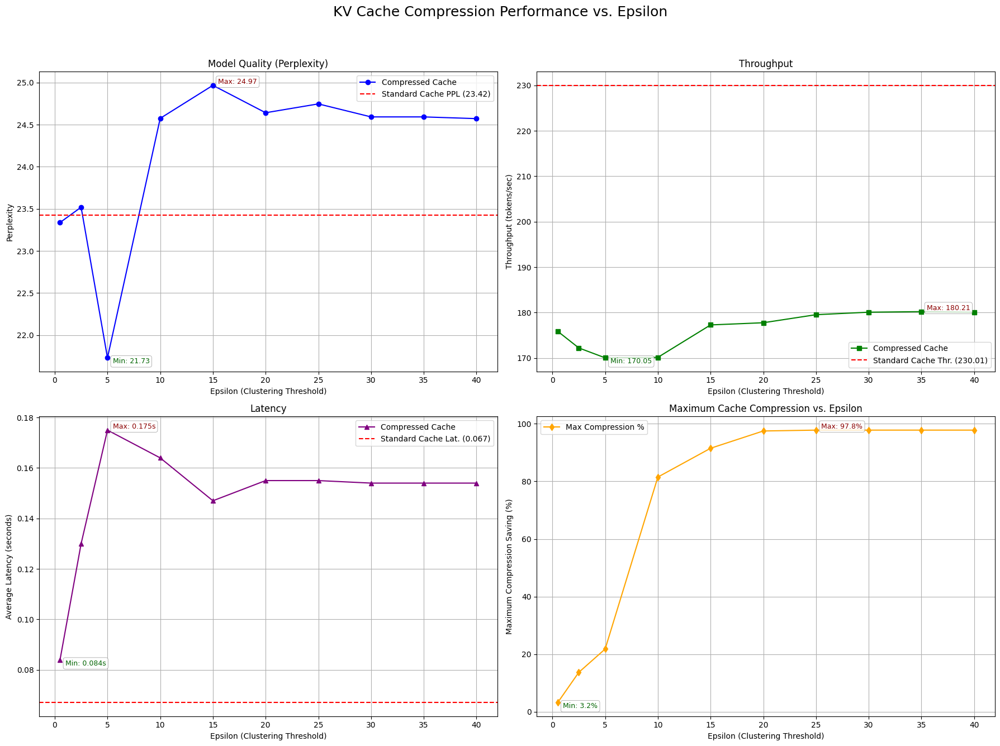

Full detailed experiment results saved to detailed_results_gpt2_final_8.xlsx
Summary of experiment results saved to summary_results_gpt2_final_8.xlsx


In [19]:
run_full_experiment(gpt2_model, gpt2_tokenizer, prompt_texts[:100], name="gpt2")

### LLAMA

--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


Generated tokens: 9
Time taken: 0.115 seconds
Generated part only: 'you \'re doing . " \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state, mode=standard_cache):
  Layer 0: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 1: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 2: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 3: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 4: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 5: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 6: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 7: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 8: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279

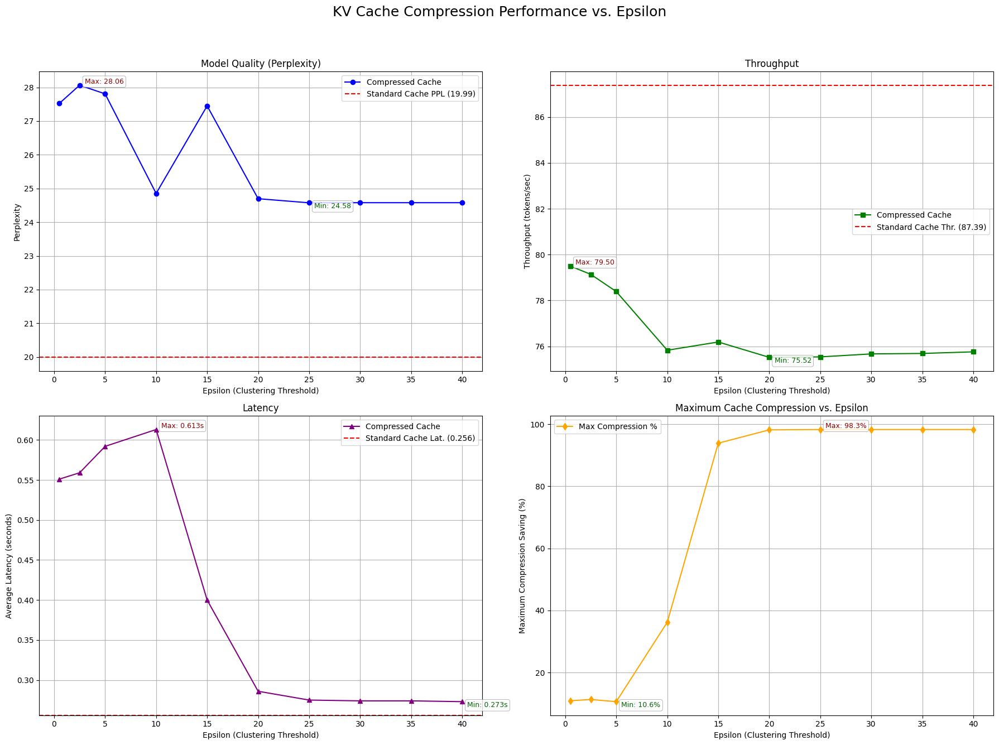

Full detailed experiment results saved to detailed_results_llama_final_8.xlsx
Summary of experiment results saved to summary_results_llama_final_8.xlsx


In [21]:
run_full_experiment(llama_model, llama_tokenizer, prompt_texts[:100], name="llama")

### FOR PLOTS

In [24]:
# --- 1. Utility Functions ---
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer
from transformers.cache_utils import DynamicCache, Cache
import math
import matplotlib.pyplot as plt

@torch._dynamo.disable
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    """Calculates perplexity by evaluating the model's loss on the input text."""
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings = tokenizer(text, return_tensors="pt")
        input_ids = encodings.input_ids.to(device)
        target_ids = input_ids.clone()
        if tokenizer.pad_token_id is not None:
            target_ids[target_ids == tokenizer.pad_token_id] = -100
        with torch.no_grad():
            outputs = model(input_ids, labels=target_ids)
            loss = outputs.loss
            num_tokens = (target_ids != -100).sum().item()
            if num_tokens > 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor):
    return tensor.numel() * tensor.element_size()

def extract_kv_pairs(past_key_values: Cache) -> list:
    """Helper to extract a list of (k, v) 4D tensors from a Cache object."""
    kv_pairs = []
    # The past_key_values object is an iterable of layers, where each layer is a tuple of (key, value)
    for layer_cache in past_key_values:
        kv_pairs.append(layer_cache)
    return kv_pairs

def rebuild_cache(pruned_kv_list: list, is_llama: bool) -> Cache:
    """Rebuilds a Cache object from a list of pruned (k,v) tensors."""
    if is_llama:
        return DynamicCache.from_legacy_cache(past_key_values=tuple(pruned_kv_list))
    else: # For GPT-2, return a standard tuple
        return tuple(pruned_kv_list)

# --- 2. Hybrid Pruning Module (Sink + Clustering) ---
class HybridCompressionModule:
    """
    Combines Attention Sinks for stability with Graph Clustering for intelligent pruning.
    This module is architecture-agnostic and works for both GPT-2 and Llama.
    """
    def __init__(self, epsilon: float, num_sink_tokens: int, device: str, clustering_iterations=20):
        self.epsilon = epsilon
        self.num_sink_tokens = num_sink_tokens
        self.device = device
        self.clustering_iterations = clustering_iterations

    def _gpu_connected_components(self, adj_matrix):
        num_heads, seq_len, _ = adj_matrix.shape
        labels = torch.arange(seq_len, device=self.device, dtype=torch.long).unsqueeze(0).expand(num_heads, -1)
        adj_matrix_with_loops = adj_matrix | torch.eye(seq_len, device=self.device, dtype=torch.bool).unsqueeze(0)
        for _ in range(self.clustering_iterations):
            propagated_labels = torch.where(adj_matrix_with_loops, labels.unsqueeze(1), seq_len)
            min_neighbor_labels = torch.min(propagated_labels, dim=2).values
            new_labels = torch.min(labels, min_neighbor_labels)
            if torch.equal(labels, new_labels): break
            labels = new_labels
        return labels

    def _prune_kv_pair(self, k_state_4d, v_state_4d):
        """
        Prunes a single layer's KV pair using clustering with centroids.
        k_state_4d, v_state_4d: (batch, num_heads, seq_len, head_dim)
        """
        batch_size, num_heads, seq_len, head_dim = k_state_4d.shape
    
        # If sequence is too short, no pruning
        if seq_len <= self.num_sink_tokens:
            return k_state_4d, v_state_4d
    
        # Keep sink tokens intact
        k_sink = k_state_4d[:, :, :self.num_sink_tokens, :]
        v_sink = v_state_4d[:, :, :self.num_sink_tokens, :]
    
        # Prunable tokens
        k_prunable = k_state_4d[:, :, self.num_sink_tokens:, :]  # (1, H, L', D)
        v_prunable = v_state_4d[:, :, self.num_sink_tokens:, :]
        k_prunable_3d = k_prunable.squeeze(0)  # (H, L', D)
        v_prunable_3d = v_prunable.squeeze(0)
    
        prunable_seq_len = k_prunable_3d.shape[1]
        if prunable_seq_len <= 1:
            return k_state_4d, v_state_4d
    
        # Pairwise distances between tokens
        distances = torch.cdist(k_prunable_3d, k_prunable_3d)  # (H, L', L')
        adjacency_matrix = distances < self.epsilon
    
        # Cluster labels via GPU connected components
        labels = self._gpu_connected_components(adjacency_matrix)
    
        # Remap labels per head (0..num_clusters-1)
        max_components = 0
        remapped_labels_list = []
        for h in range(num_heads):
            unique, inverse = torch.unique(labels[h], return_inverse=True)
            remapped_labels_list.append(inverse)
            if unique.numel() > max_components:
                max_components = unique.numel()
        remapped_labels = torch.stack(remapped_labels_list)  # (H, L')
    
        # Expand for scatter_add
        remapped_labels_exp = remapped_labels.unsqueeze(-1).expand(-1, -1, head_dim)  # (H, L', D)
    
        # --- BUG FIX START ---
        # The original code incorrectly initialized counts to 1. 
        # The correct method is to initialize to 0, count, then clamp before division.
    
        # 1. Initialize sum and count tensors to zeros
        centroids_sum_k = torch.zeros(
            (num_heads, max_components, head_dim),
            dtype=k_prunable_3d.dtype, device=self.device
        )
        centroids_sum_v = torch.zeros_like(centroids_sum_k)
        counts = torch.zeros(
            (num_heads, max_components), device=self.device, dtype=torch.long
        )
    
        # 2. Add 1 to the count for each token in its corresponding cluster
        counts.scatter_add_(1, remapped_labels, torch.ones_like(remapped_labels))
    
        # 3. Sum the K and V vectors for each cluster
        centroids_sum_k.scatter_add_(1, remapped_labels_exp, k_prunable_3d)
        centroids_sum_v.scatter_add_(1, remapped_labels_exp, v_prunable_3d)
        
        # 4. Clamp counts AFTER counting to prevent division by zero.
        #    Unsqueeze to make dimensions compatible for broadcasting during division.
        counts = counts.unsqueeze(-1).clamp(min=1)
    
        # 5. Compute centroids (the correct average)
        centroids_k = centroids_sum_k / counts
        centroids_v = centroids_sum_v / counts
        # --- BUG FIX END ---
    
        # Merge sink tokens + centroids
        final_k = torch.cat([k_sink, centroids_k.unsqueeze(0)], dim=2)  # (1, H, S + C, D)
        final_v = torch.cat([v_sink, centroids_v.unsqueeze(0)], dim=2)
    
        return final_k, final_v


    def compress_kv_cache(self, past_key_values: Cache, is_llama: bool) -> list:
        # GPT-2 uses a tuple, Llama uses a Cache object. We need to handle both.
        if is_llama:
            kv_pairs = extract_kv_pairs(past_key_values)
        else:
            kv_pairs = list(past_key_values)

        return [self._prune_kv_pair(k, v) for k, v in kv_pairs]

# --- 3. BENCHMARK ORCHESTRATOR ---
def run_single_benchmark(model, tokenizer, prompt_texts, mode, device,
                         epsilon=2.0, num_sink_tokens=4,
                         max_new_tokens=50, compression_interval=16,
                         standard_cache_sizes=None):
    print(f"--- Evaluating with Mode: {mode.upper()} ---")
    if mode == 'compressed_cache':
        print(f"      (Epsilon: {epsilon}, Sink: {num_sink_tokens} tokens, Interval: {compression_interval} tokens)")

    is_llama = "llama" in model.config.model_type.lower()
    if torch.cuda.is_available():
        torch.cuda.empty_cache(); torch.cuda.reset_peak_memory_stats()

    compression_module = HybridCompressionModule(epsilon, num_sink_tokens, device)
    times, total_generated_tokens, generated_texts_for_ppl, all_prompt_results = [], 0, [], []

    for i, prompt in enumerate(prompt_texts):
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        input_len = inputs.input_ids.shape[1]
        print(f"Prompt: {i} ", prompt)
        print(f"Input tokens: {input_len}")
        torch.manual_seed(42)
        
        start_time = time.time()
        
        with torch.no_grad():
            if mode == 'compressed_cache':
                generated_ids = inputs.input_ids
                attention_mask = inputs.attention_mask
                past_key_values = None

                for step in range(max_new_tokens):
                    if past_key_values is not None:
                        if is_llama:
                            current_seq_len = past_key_values.get_seq_length()
                        else:
                            current_seq_len = past_key_values[0][0].shape[2]
                        input_token = generated_ids[:, -1:]
                    else:
                        current_seq_len = generated_ids.shape[1]
                        input_token = generated_ids

                    model_inputs = {
                        'input_ids': input_token, 
                        'past_key_values': past_key_values, 
                        'use_cache': True,
                        'attention_mask': attention_mask
                    }
                    if is_llama:
                        model_inputs['cache_position'] = torch.arange(current_seq_len, current_seq_len + input_token.shape[1], device=device)

                    outputs = model(**model_inputs)
                    next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                    
                    if tokenizer.eos_token_id is not None and next_token.item() == tokenizer.eos_token_id:
                        break

                    generated_ids = torch.cat([generated_ids, next_token], dim=-1)
                    attention_mask = torch.cat([attention_mask, torch.ones((attention_mask.shape[0], 1), device=device, dtype=torch.long)], dim=1)
                    
                    past_key_values = outputs.past_key_values

                    num_generated = step + 1
                    if num_generated % compression_interval == 0 and past_key_values is not None:
                        pruned_kv_list = compression_module.compress_kv_cache(past_key_values, is_llama)
                        past_key_values = rebuild_cache(pruned_kv_list, is_llama)
                        if is_llama:
                            new_seq_len = past_key_values.get_seq_length()
                        else:
                            new_seq_len = past_key_values[0][0].shape[2]
                        
                        attention_mask = torch.ones((inputs.input_ids.shape[0], new_seq_len), device=device, dtype=torch.long)
                
                sequences = generated_ids
            else:
                use_cache_flag = (mode == 'standard_cache')
                if mode == 'no_cache':
                    use_cache_flag = False
                
                outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, use_cache=use_cache_flag,
                                         do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                         return_dict_in_generate=True, output_scores=True)
                sequences = outputs.sequences

        if torch.cuda.is_available(): torch.cuda.synchronize()
        elapsed_time = time.time() - start_time
        generated_tokens = sequences.shape[1] - input_len
        if generated_tokens <= 0: continue
        total_generated_tokens += generated_tokens
        times.append(elapsed_time)
        full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
        generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
        generated_texts_for_ppl.append(full_generated_text)
        print(f"Generated tokens: {generated_tokens}")
        print(f"Time taken: {elapsed_time:.3f} seconds")
        print(f"Generated part only: {repr(generated_part_text)}")
        print("-" * 50)

        total_kv_bytes = 0
        final_past_key_values = None
        if 'outputs' in locals() and hasattr(outputs, 'past_key_values') and outputs.past_key_values is not None:
            final_past_key_values = outputs.past_key_values
        elif 'past_key_values' in locals() and past_key_values is not None:
            final_past_key_values = past_key_values
            
        if final_past_key_values:
            kv_pairs = extract_kv_pairs(final_past_key_values) if is_llama else list(final_past_key_values)
            print(f"\nKV Cache Shapes and Sizes per Layer (final state, mode={mode}):")
            for layer_idx, (k, v) in enumerate(kv_pairs):
                layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                total_kv_bytes += layer_bytes
                print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
            print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
        
        memory_saving_kib = 0
        memory_saving_percent = 'N/A'
        
        if mode == 'compressed_cache' and standard_cache_sizes:
            standard_size_kib = standard_cache_sizes.get(i) # i is the prompt_id
            if standard_size_kib and isinstance(standard_size_kib, (int, float)) and standard_size_kib > 0:
                standard_size_bytes = standard_size_kib * 1024
                if total_kv_bytes > 0:
                    memory_saving_kib = (standard_size_bytes - total_kv_bytes) / 1024
                    saving_percent = (memory_saving_kib * 1024 / standard_size_bytes) * 100 if standard_size_bytes > 0 else 0
                    memory_saving_percent = round(saving_percent, 1)
                    
                    print(f"  --> Comparison with Standard Cache:")
                    print(f"      Standard Size  : {standard_size_kib:.2f} KiB")
                    print(f"      Compressed Size: {total_kv_bytes/1024:.2f} KiB")
                    print(f"      Saving         : {memory_saving_kib:.2f} KiB ({memory_saving_percent:.1f}%)\n")

        output_len = sequences.shape[1]
        result_row = {'mode': mode, 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A', 'prompt_id': i,
                      'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                      'input_tokens': input_len, 'generated_tokens': generated_tokens, 'total_tokens': output_len,
                      'time_taken_sec': round(elapsed_time, 3),
                      'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                      'kv_cache_saving_kib': round(memory_saving_kib, 2) if memory_saving_kib > 0 else 'N/A',
                      'kv_cache_saving_percent': memory_saving_percent,
                      'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text}
        all_prompt_results.append(result_row)
    
    avg_latency = np.mean(times) if times else 0
    std_latency = np.std(times) if times else 0
    total_time = sum(times)
    throughput = total_generated_tokens / total_time if total_time > 0 else 0
    peak_memory_mib = torch.cuda.max_memory_allocated() / 1024 / 1024 if torch.cuda.is_available() else 0
    
    avg_saving_kib = 0
    if mode == 'compressed_cache':
        savings = [r['kv_cache_saving_kib'] for r in all_prompt_results if isinstance(r['kv_cache_saving_kib'], (int, float)) and r['kv_cache_saving_kib'] != 'N/A']
        if savings: avg_saving_kib = np.mean(savings)

    print("  Calculating perplexity...")
    perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)
    summary = {'mode': f"SUMMARY_{mode}", 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A',
               'avg_perplexity': round(perplexity_score, 4),'throughput_tokens_per_sec': round(throughput, 2),
               'avg_latency_sec': round(avg_latency, 3),'std_latency_sec': round(std_latency, 3),
               'peak_memory_mib': round(peak_memory_mib, 2),
               'avg_memory_saving_kib': round(avg_saving_kib, 2)}

    print(f"\nSummary for mode={mode}:")
    print(f"  Average Latency: {summary['avg_latency_sec']:.3f} ± {summary['std_latency_sec']:.3f} sec")
    print(f"  Throughput: {summary['throughput_tokens_per_sec']:.2f} tokens/sec")
    print(f"  Perplexity on generated outputs: {summary['avg_perplexity']:.4f}")
    if peak_memory_mib > 0: print(f"  Peak Memory Usage for this mode: {summary['peak_memory_mib']:.2f} MiB")
    if avg_saving_kib > 0: print(f"  Average Memory Saving on successful savings (>0): {summary['avg_memory_saving_kib']:.2f} KiB")
    print("="*60 + "\n")
    return summary, all_prompt_results

# --- 4. Plotting Function ---
def plot_results(plot_data, baseline_summary, all_results_df):
    """
    Plots the benchmark results, showing performance vs. epsilon.
    Includes baseline comparisons and min/max annotations for each metric.
    Annotations now use simple text labels without arrows to avoid clutter.
    """
    if not plot_data:
        return

    epsilons = [d['epsilon'] for d in plot_data]
    perplexities = [d['avg_perplexity'] for d in plot_data]
    throughputs = [d['throughput_tokens_per_sec'] for d in plot_data]
    latencies = [d['avg_latency_sec'] for d in plot_data]

    baseline_perplexity = baseline_summary.get('avg_perplexity')
    baseline_throughput = baseline_summary.get('throughput_tokens_per_sec')
    baseline_latency = baseline_summary.get('avg_latency_sec')

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    fig.suptitle('KV Cache Compression Performance vs. Epsilon', fontsize=18)
    
    # --- Annotation styling for text labels ---
    text_bbox = dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.5, alpha=0.8) # Light background for readability
    text_props_min = {'fontsize': 9, 'color': 'darkgreen', 'ha': 'left', 'va': 'top'}
    text_props_max = {'fontsize': 9, 'color': 'darkred', 'ha': 'left', 'va': 'bottom'}
    offset_x = 0.5 # Small offset in x-direction for labels

    # ===================================================================
    # 1. Perplexity Plot
    # ===================================================================
    ax = axes[0, 0]
    ax.plot(epsilons, perplexities, marker='o', linestyle='-', color='b', label='Compressed Cache')
    if baseline_perplexity is not None:
        ax.axhline(y=baseline_perplexity, color='r', linestyle='--', label=f'Standard Cache PPL ({baseline_perplexity:.2f})')
    
    # --- Min/Max Annotations for Perplexity ---
    min_idx = np.argmin(perplexities)
    max_idx = np.argmax(perplexities)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, perplexities[min_idx],
            f'Min: {perplexities[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, perplexities[max_idx],
                f'Max: {perplexities[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Model Quality (Perplexity)')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Perplexity')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 2. Throughput Plot
    # ===================================================================
    ax = axes[0, 1]
    ax.plot(epsilons, throughputs, marker='s', linestyle='-', color='g', label='Compressed Cache')
    if baseline_throughput is not None:
        ax.axhline(y=baseline_throughput, color='r', linestyle='--', label=f'Standard Cache Thr. ({baseline_throughput:.2f})')

    # --- Min/Max Annotations for Throughput ---
    min_idx = np.argmin(throughputs)
    max_idx = np.argmax(throughputs)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, throughputs[min_idx],
            f'Min: {throughputs[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, throughputs[max_idx],
                f'Max: {throughputs[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Throughput')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Throughput (tokens/sec)')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 3. Latency Plot
    # ===================================================================
    ax = axes[1, 0]
    ax.plot(epsilons, latencies, marker='^', linestyle='-', color='purple', label='Compressed Cache')
    if baseline_latency is not None:
        ax.axhline(y=baseline_latency, color='r', linestyle='--', label=f'Standard Cache Lat. ({baseline_latency:.3f})')
        
    # --- Min/Max Annotations for Latency ---
    min_idx = np.argmin(latencies)
    max_idx = np.argmax(latencies)
    
    # Annotate Min
    ax.text(epsilons[min_idx] + offset_x, latencies[min_idx],
            f'Min: {latencies[min_idx]:.3f}s',
            bbox=text_bbox, **text_props_min)
    
    # Annotate Max (only if different from min)
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, latencies[max_idx],
                f'Max: {latencies[max_idx]:.3f}s',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Latency')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Average Latency (seconds)')
    ax.grid(True)
    ax.legend()

    # ===================================================================
    # 4. Max Compression Percentage Plot
    # ===================================================================
    ax = axes[1, 1]
    max_compression_percentages = []
    if not all_results_df.empty:
        compressed_df = all_results_df[all_results_df['mode'] == 'compressed_cache'].copy()
        compressed_df['kv_cache_saving_percent'] = pd.to_numeric(compressed_df['kv_cache_saving_percent'], errors='coerce')
        if not compressed_df.empty:
            max_savings_by_epsilon = compressed_df.groupby('epsilon')['kv_cache_saving_percent'].max()
            max_compression_percentages = [max_savings_by_epsilon.get(eps, 0) for eps in epsilons]

    ax.plot(epsilons, max_compression_percentages, marker='d', linestyle='-', color='orange', label='Max Compression %')
    
    # --- Min/Max Annotations for Compression ---
    if max_compression_percentages:
        min_idx = np.argmin(max_compression_percentages)
        max_idx = np.argmax(max_compression_percentages)
        
        # Annotate Min
        ax.text(epsilons[min_idx] + offset_x, max_compression_percentages[min_idx],
                f'Min: {max_compression_percentages[min_idx]:.1f}%',
                bbox=text_bbox, **text_props_min)
        
        # Annotate Max (only if different from min)
        if min_idx != max_idx:
            ax.text(epsilons[max_idx] + offset_x, max_compression_percentages[max_idx],
                    f'Max: {max_compression_percentages[max_idx]:.1f}%',
                    bbox=text_bbox, **text_props_max)

    ax.set_title('Maximum Cache Compression vs. Epsilon')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Maximum Compression Saving (%)')
    ax.grid(True)
    ax.legend()
    
    # --- Final Touches ---
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plot_filename = "MORE_EPSILONS_compression_metrics_vs_epsilon_llama_8.png" # Changed filename
    plt.savefig(plot_filename)
    print(f"\nMetrics plot saved to {plot_filename}")
    plt.show()


# --- 5. Main Experiment Runner ---
def run_full_experiment(model, tokenizer, prompt_texts, name="model"):
    device = model.device
    print("--- Warming up model... ---")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for _ in range(2):
        with torch.no_grad(): model.generate(**warmup_inputs, max_new_tokens=5, use_cache=True)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")
    
    all_results_df = pd.DataFrame()
    
    standard_cache_summary, standard_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'standard_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(standard_prompt_results)], ignore_index=True)

    standard_cache_sizes = {res['prompt_id']: res['kv_cache_size_kib'] for res in standard_prompt_results}
    
    no_cache_summary, no_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'no_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(no_prompt_results)], ignore_index=True)

    is_llama = "llama" in model.config.model_type.lower()
    if is_llama:
        epsilon_values = [40.0, 45.0, 50.0, 60.0, 75.0]
    else:
        epsilon_values = [40.0, 45.0, 50.0, 60.0, 75.0]

    compression_summaries = []

    for epsilon in epsilon_values:
        summary, prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'compressed_cache', device,
                                                       epsilon=epsilon, 
                                                       num_sink_tokens=4, 
                                                       max_new_tokens=50, 
                                                       compression_interval=8,
                                                       standard_cache_sizes=standard_cache_sizes)
        compression_summaries.append(summary)
        all_results_df = pd.concat([all_results_df, pd.DataFrame(prompt_results)], ignore_index=True)
    
    if compression_summaries:
        # --- MODIFIED: Pass the detailed df to the plotting function ---
        plot_results(compression_summaries, standard_cache_summary, all_results_df)
    
    summary_df = pd.DataFrame([standard_cache_summary, no_cache_summary] + compression_summaries)
    
    detailed_filename = f"MORE_EPSILONS_detailed_results_{name}_final_8.xlsx"
    all_results_df.to_excel(detailed_filename, index=False)
    print(f"Full detailed experiment results saved to {detailed_filename}")
    summary_filename = f"MORE_EPSILONS_summary_results_{name}_final_8.xlsx"
    summary_df.to_excel(summary_filename, index=False)
    print(f"Summary of experiment results saved to {summary_filename}")

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

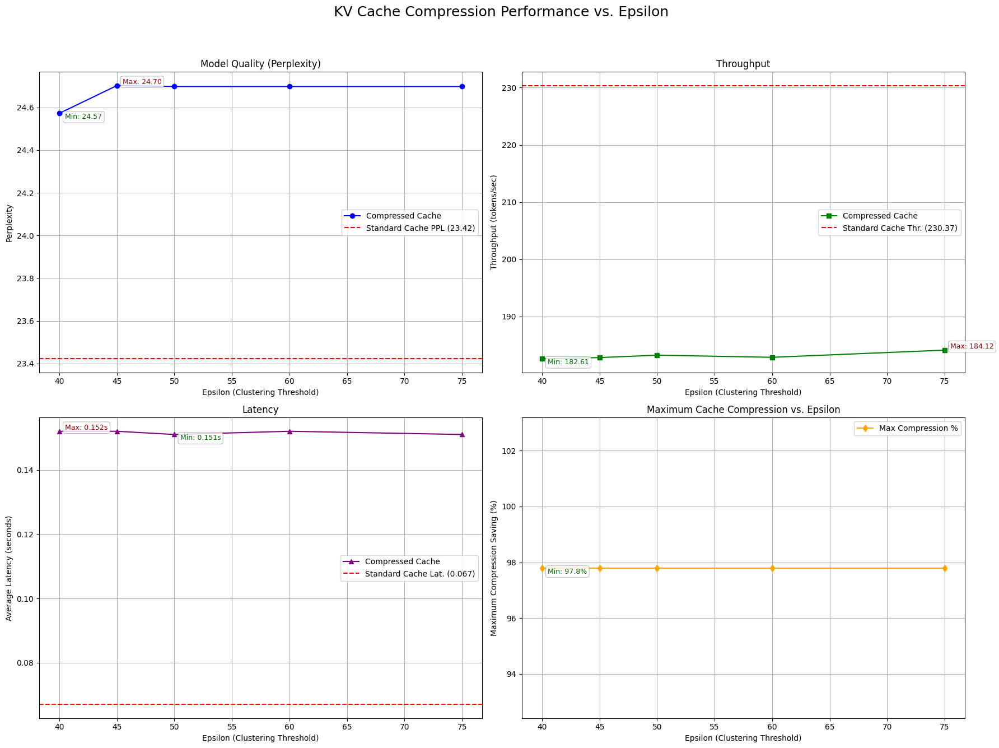

Full detailed experiment results saved to MORE_EPSILONS_detailed_results_gpt2_final_8.xlsx
Summary of experiment results saved to MORE_EPSILONS_summary_results_gpt2_final_8.xlsx


In [23]:
run_full_experiment(gpt2_model, gpt2_tokenizer, prompt_texts[:100], name="gpt2")

--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


Generated tokens: 9
Time taken: 0.113 seconds
Generated part only: 'you \'re doing . " \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state, mode=standard_cache):
  Layer 0: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 1: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 2: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 3: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 4: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 5: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 6: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 7: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 8: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279

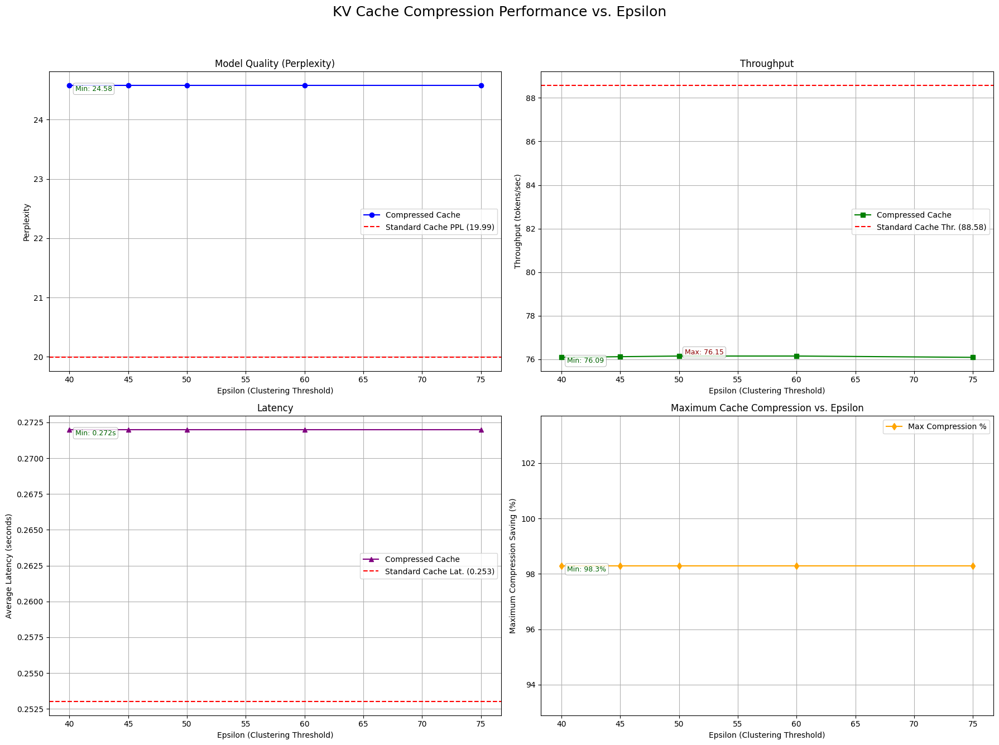

Full detailed experiment results saved to MORE_EPSILONS_detailed_results_llama_final_8.xlsx
Summary of experiment results saved to MORE_EPSILONS_summary_results_llama_final_8.xlsx


In [25]:
run_full_experiment(llama_model, llama_tokenizer, prompt_texts[:100], name="llama")